<a href="https://colab.research.google.com/github/sadikinisaac/AIML/blob/main/hdbcarpark.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

✅ All libraries imported successfully!
STEP 1: LOADING DATA
📁 File not found locally. Please upload the file:


Saving HDBCarparkInformation.csv to HDBCarparkInformation.csv
✅ File 'HDBCarparkInformation.csv' uploaded and loaded successfully!

📊 Dataset Shape: (2262, 12)
   Rows (records): 2,262
   Columns (features): 12

👁️ First 5 rows of the dataset:
  car_park_no                                      address     x_coord  \
0         ACB  BLK 270/271 ALBERT CENTRE BASEMENT CAR PARK  30314.7936   
1         ACM                    BLK 98A ALJUNIED CRESCENT  33758.4143   
2         AH1                          BLK 101 JALAN DUSUN  29257.7203   
3        AK19               BLOCK 253 ANG MO KIO STREET 21  28185.4359   
4        AK31             BLK 302/348 ANG MO KIO STREET 31  29482.0290   

      y_coord          car_park_type type_of_parking_system  \
0  31490.4942      BASEMENT CAR PARK     ELECTRONIC PARKING   
1  33695.5198  MULTI-STOREY CAR PARK     ELECTRONIC PARKING   
2  34500.3599       SURFACE CAR PARK     ELECTRONIC PARKING   
3  39012.6664       SURFACE CAR PARK         COUPON PARKING

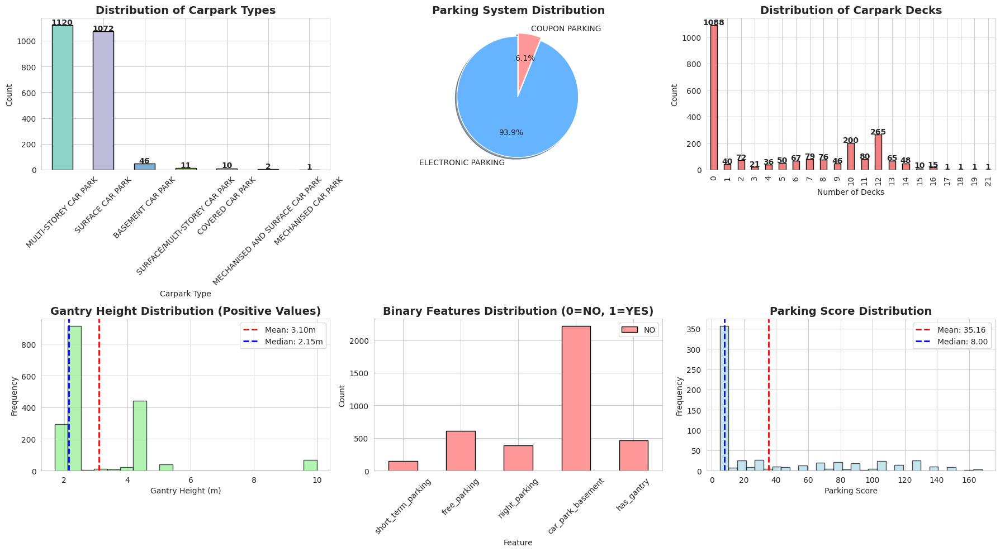


📊 Correlation Analysis...
Numerical columns: ['x_coord', 'y_coord', 'short_term_parking', 'free_parking', 'night_parking', 'car_park_decks', 'gantry_height', 'car_park_basement', 'has_gantry', 'has_short_term', 'is_24hr_parking', 'parking_score']


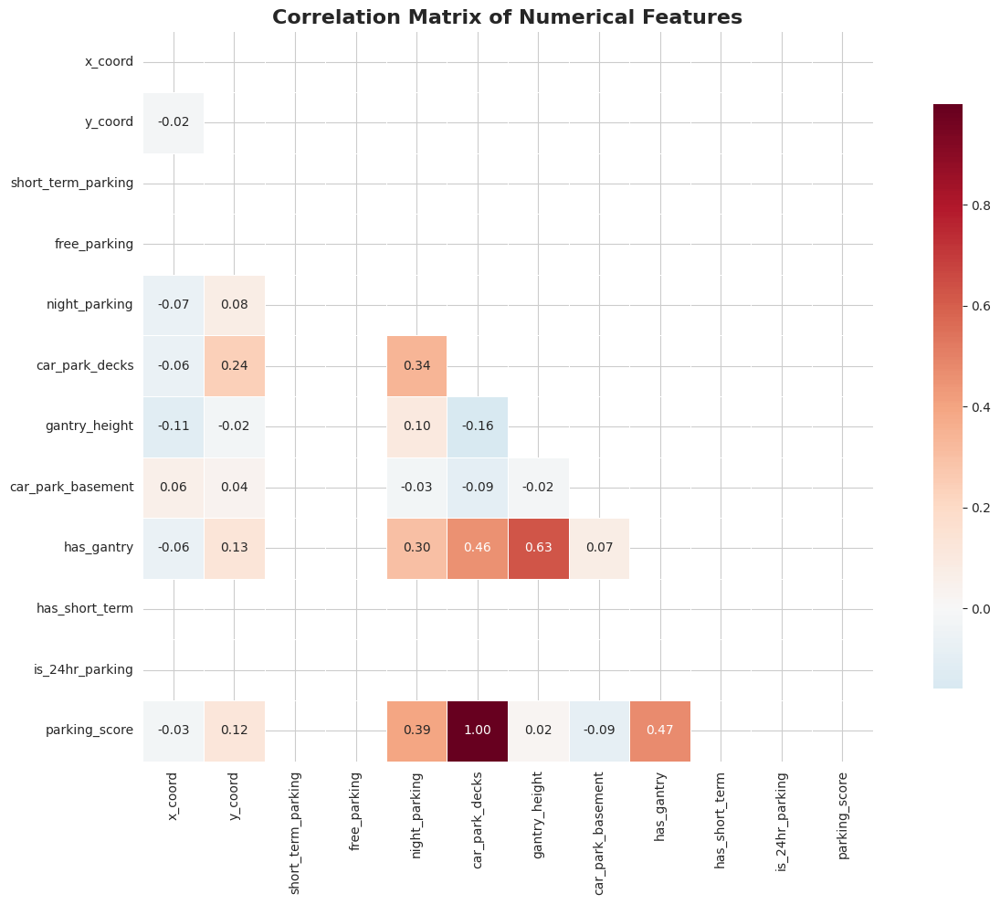


🗺️ Geographic Analysis...


✅ Interactive map created! Zoom in to see individual carparks.


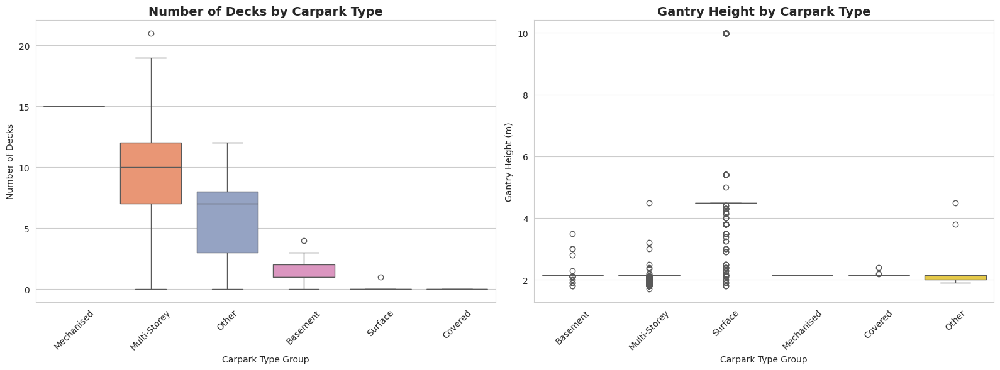

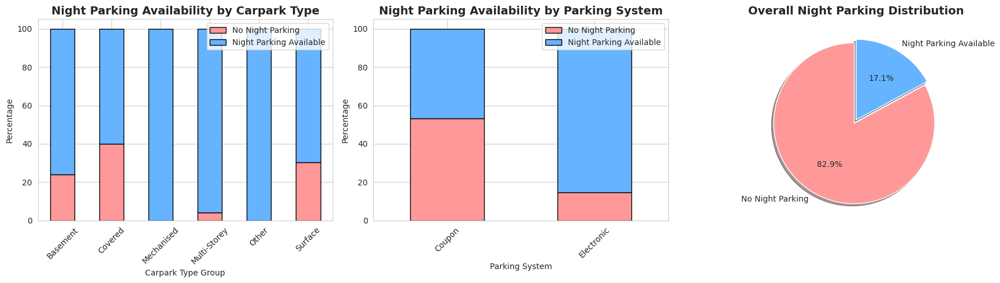

STEP 5: FEATURE ENGINEERING FOR MACHINE LEARNING

📌 Creating ML features...
✅ Created 17 new features
📊 Total features now: 39

📋 New columns added:
  - address_length
  - amenities_count
  - carpark_type_encoded
  - carpark_type_group_encoded
  - decks_gantry_interaction
  - distance_from_city
  - has_central
  - has_road
  - parking_system_encoded
  - parking_system_group_encoded
  - region_x
  - region_x_encoded
  - region_y
  - region_y_encoded
  - target_has_decks
  - target_night_parking
  - type_system_interaction
STEP 6: DATA PREPARATION FOR MACHINE LEARNING

📊 Feature matrix shape: (2262, 20)
🎯 Target vector shape: (2262,)

📈 Target distribution:
target_night_parking
1    1875
0     387
Name: count, dtype: int64
Target distribution (%):
target_night_parking
1    82.891247
0    17.108753
Name: proportion, dtype: float64

🚂 Train set: (1809, 20)
🧪 Test set: (453, 20)

✅ Features scaled: 20 numerical columns

📋 Feature names:
  1. car_park_decks
  2. gantry_height
  3. car_park_b

ValueError: Input X contains NaN.
LogisticRegression does not accept missing values encoded as NaN natively. For supervised learning, you might want to consider sklearn.ensemble.HistGradientBoostingClassifier and Regressor which accept missing values encoded as NaNs natively. Alternatively, it is possible to preprocess the data, for instance by using an imputer transformer in a pipeline or drop samples with missing values. See https://scikit-learn.org/stable/modules/impute.html You can find a list of all estimators that handle NaN values at the following page: https://scikit-learn.org/stable/modules/impute.html#estimators-that-handle-nan-values

In [1]:
# -*- coding: utf-8 -*-
"""HDB_Carpark_Analysis.ipynb

Automatically generated by Colaboratory.

# Singapore HDB Carpark Information Analysis
## Data Cleaning, Analysis, and Machine Learning Prediction
"""

# Install required packages
!pip install -q pandas numpy matplotlib seaborn scikit-learn xgboost lightgbm tensorflow folium plotly

"""## 1. Import Libraries"""

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import warnings
import os
import re
from google.colab import files
import io
import folium
from folium.plugins import MarkerCluster
import plotly.express as px
import plotly.graph_objects as go
from plotly.subplots import make_subplots

# Machine Learning Libraries
from sklearn.model_selection import train_test_split, cross_val_score, GridSearchCV, StratifiedKFold, learning_curve
from sklearn.preprocessing import LabelEncoder, StandardScaler, OneHotEncoder
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline
from sklearn.impute import SimpleImputer

# Classification Models
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier, AdaBoostClassifier
from sklearn.svm import SVC
from xgboost import XGBClassifier
from lightgbm import LGBMClassifier

# Deep Learning
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers, models, callbacks

# Metrics
from sklearn.metrics import (accuracy_score, precision_score, recall_score, f1_score,
                             confusion_matrix, classification_report, roc_auc_score,
                             roc_curve, auc, precision_recall_curve)

# Clustering
from sklearn.cluster import KMeans, DBSCAN
from sklearn.decomposition import PCA
from sklearn.metrics import silhouette_score

# Set style
warnings.filterwarnings('ignore')
sns.set_style('whitegrid')
plt.rcParams['figure.figsize'] = (12, 6)
pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', 100)

print("✅ All libraries imported successfully!")

"""## 2. Load and Upload Data"""

print("=" * 60)
print("STEP 1: LOADING DATA")
print("=" * 60)

# Load Dataset
try:
    df = pd.read_csv('HDBCarparkInformation.csv')
    print("✅ File loaded successfully from local directory!")
except FileNotFoundError:
    print("📁 File not found locally. Please upload the file:")
    from google.colab import files
    uploaded = files.upload()
    filename = list(uploaded.keys())[0]
    df = pd.read_csv(io.BytesIO(uploaded[filename]))
    print(f"✅ File '{filename}' uploaded and loaded successfully!")

print(f"\n📊 Dataset Shape: {df.shape}")
print(f"   Rows (records): {df.shape[0]:,}")
print(f"   Columns (features): {df.shape[1]}")

# Display first few rows
print("\n👁️ First 5 rows of the dataset:")
print(df.head())

"""## 3. Data Overview and Initial Exploration"""

print("=" * 60)
print("STEP 2: DATA OVERVIEW")
print("=" * 60)

# Basic info
print("\n📋 Dataset Info:")
print(df.info())

# Data types
print("\n📊 Data Types:")
print(df.dtypes)

# Statistical summary
print("\n📈 Statistical Summary (Numerical Columns):")
print(df.describe())

# Check for missing values
print("\n🔍 Missing Values:")
missing = df.isnull().sum()
print(missing[missing > 0] if any(missing > 0) else "No missing values found!")

# Check for duplicates
print(f"\n🔁 Duplicate rows: {df.duplicated().sum()}")

# Value counts for categorical columns
categorical_cols = df.select_dtypes(include=['object']).columns
print("\n🏷️ Categorical Columns Value Counts:")
for col in categorical_cols:
    print(f"\n{col}:")
    print(df[col].value_counts().head())

"""## 4. Data Cleaning"""

print("=" * 60)
print("STEP 3: DATA CLEANING")
print("=" * 60)

def clean_carpark_data(df):
    """
    Comprehensive data cleaning function for HDB Carpark data
    """
    df_clean = df.copy()

    # 1. Handle missing values
    print("\n📌 Handling missing values...")

    # For numerical columns, fill with median
    numerical_cols = df_clean.select_dtypes(include=[np.number]).columns.tolist()
    for col in numerical_cols:
        if df_clean[col].isnull().sum() > 0:
            df_clean[col].fillna(df_clean[col].median(), inplace=True)

    # For categorical columns, fill with mode
    for col in categorical_cols:
        if df_clean[col].isnull().sum() > 0:
            df_clean[col].fillna(df_clean[col].mode()[0] if not df_clean[col].mode().empty else 'Unknown', inplace=True)

    print("✅ Missing values handled!")

    # 2. Convert YES/NO columns to binary
    binary_columns = ['short_term_parking', 'free_parking', 'night_parking', 'car_park_basement']

    print("\n📌 Converting YES/NO columns to binary...")
    for col in binary_columns:
        if col in df_clean.columns:
            df_clean[col] = df_clean[col].map({'YES': 1, 'NO': 0, 'Y': 1, 'N': 0})
            print(f"✅ Converted {col}")

    # 3. Clean gantry_height - replace 0 with NaN and handle special values
    if 'gantry_height' in df_clean.columns:
        df_clean['gantry_height'] = pd.to_numeric(df_clean['gantry_height'], errors='coerce')
        df_clean['gantry_height'].fillna(0, inplace=True)
        df_clean['has_gantry'] = (df_clean['gantry_height'] > 0).astype(int)
        print("✅ Processed gantry_height")

    # 4. Extract information from address
    if 'address' in df_clean.columns:
        # Extract postal code if present (Singapore addresses often end with 6-digit)
        df_clean['postal_code'] = df_clean['address'].str.extract(r'(\d{6})$')

        # Extract block number
        df_clean['block_number'] = df_clean['address'].str.extract(r'BLK\s*(\d+[A-Z]*)', flags=re.IGNORECASE)

        print("✅ Extracted address features")

    # 5. Create derived features
    print("\n📌 Creating derived features...")

    # Carpark type groups
    type_mapping = {
        'MULTI-STOREY CAR PARK': 'Multi-Storey',
        'SURFACE CAR PARK': 'Surface',
        'BASEMENT CAR PARK': 'Basement',
        'MECHANISED CAR PARK': 'Mechanised',
        'COVERED CAR PARK': 'Covered'
    }
    df_clean['carpark_type_group'] = df_clean['car_park_type'].map(type_mapping).fillna('Other')

    # Parking system groups
    system_mapping = {
        'ELECTRONIC PARKING': 'Electronic',
        'COUPON PARKING': 'Coupon'
    }
    df_clean['parking_system_group'] = df_clean['type_of_parking_system'].map(system_mapping).fillna('Other')

    # Time-based features from short_term_parking
    df_clean['has_short_term'] = (df_clean['short_term_parking'] != 'NO').astype(int)
    df_clean['is_24hr_parking'] = (df_clean['short_term_parking'] == 'WHOLE DAY').astype(int)

    # Create a "parking availability score" (higher is better)
    df_clean['parking_score'] = (
        df_clean['car_park_decks'] * 10 +
        df_clean['has_short_term'] * 5 +
        df_clean['night_parking'] * 3 +
        df_clean['free_parking'] * 2 -
        df_clean['car_park_basement'] * 1
    )

    print("✅ Derived features created!")

    return df_clean

df_cleaned = clean_carpark_data(df)

print("\n" + "=" * 60)
print("CLEANED DATASET INFO")
print("=" * 60)
print(f"Shape: {df_cleaned.shape}")
print(f"\nColumns: {df_cleaned.columns.tolist()}")
print(f"\nData Types:\n{df_cleaned.dtypes}")

# Final check for missing values
print("\n🔍 Final check for missing values:")
print(df_cleaned.isnull().sum()[df_cleaned.isnull().sum() > 0] if any(df_cleaned.isnull().sum() > 0) else "No missing values found!")

"""## 5. Exploratory Data Analysis (EDA)"""

print("=" * 60)
print("STEP 4: EXPLORATORY DATA ANALYSIS")
print("=" * 60)

### 5.1 Distribution of Carpark Types

fig, axes = plt.subplots(2, 3, figsize=(18, 10))

# 1. Carpark Type Distribution
ax1 = axes[0, 0]
type_counts = df_cleaned['car_park_type'].value_counts()
colors = plt.cm.Set3(np.linspace(0, 1, len(type_counts)))
type_counts.plot(kind='bar', ax=ax1, color=colors, edgecolor='black')
ax1.set_title('Distribution of Carpark Types', fontsize=14, fontweight='bold')
ax1.set_xlabel('Carpark Type')
ax1.set_ylabel('Count')
ax1.tick_params(axis='x', rotation=45)
for i, v in enumerate(type_counts):
    ax1.text(i, v + 5, str(v), ha='center', fontweight='bold')

# 2. Parking System Distribution
ax2 = axes[0, 1]
system_counts = df_cleaned['type_of_parking_system'].value_counts()
system_counts.plot(kind='pie', ax=ax2, autopct='%1.1f%%', colors=['#66b3ff', '#ff9999'],
                   explode=(0.05, 0), shadow=True, startangle=90)
ax2.set_title('Parking System Distribution', fontsize=14, fontweight='bold')
ax2.set_ylabel('')

# 3. Carpark Decks Distribution
ax3 = axes[0, 2]
deck_counts = df_cleaned['car_park_decks'].value_counts().sort_index()
deck_counts.plot(kind='bar', ax=ax3, color='lightcoral', edgecolor='black')
ax3.set_title('Distribution of Carpark Decks', fontsize=14, fontweight='bold')
ax3.set_xlabel('Number of Decks')
ax3.set_ylabel('Count')
for i, v in enumerate(deck_counts):
    ax3.text(i, v + 5, str(v), ha='center', fontweight='bold')

# 4. Gantry Height Distribution
ax4 = axes[1, 0]
gantry_positive = df_cleaned[df_cleaned['gantry_height'] > 0]['gantry_height']
ax4.hist(gantry_positive, bins=20, color='lightgreen', edgecolor='black', alpha=0.7)
ax4.set_title('Gantry Height Distribution (Positive Values)', fontsize=14, fontweight='bold')
ax4.set_xlabel('Gantry Height (m)')
ax4.set_ylabel('Frequency')
ax4.axvline(gantry_positive.mean(), color='red', linestyle='--', linewidth=2, label=f'Mean: {gantry_positive.mean():.2f}m')
ax4.axvline(gantry_positive.median(), color='blue', linestyle='--', linewidth=2, label=f'Median: {gantry_positive.median():.2f}m')
ax4.legend()

# 5. Binary Features Distribution
ax5 = axes[1, 1]
binary_features = ['short_term_parking', 'free_parking', 'night_parking', 'car_park_basement', 'has_gantry']
binary_counts = pd.DataFrame()
for feat in binary_features:
    if feat in df_cleaned.columns:
        binary_counts[feat] = df_cleaned[feat].value_counts().sort_index()

binary_counts.T.plot(kind='bar', ax=ax5, color=['#ff9999', '#66b3ff'], edgecolor='black')
ax5.set_title('Binary Features Distribution (0=NO, 1=YES)', fontsize=14, fontweight='bold')
ax5.set_xlabel('Feature')
ax5.set_ylabel('Count')
ax5.legend(['NO', 'YES'])
ax5.tick_params(axis='x', rotation=45)

# 6. Parking Score Distribution
ax6 = axes[1, 2]
ax6.hist(df_cleaned['parking_score'], bins=30, color='lightblue', edgecolor='black', alpha=0.7)
ax6.set_title('Parking Score Distribution', fontsize=14, fontweight='bold')
ax6.set_xlabel('Parking Score')
ax6.set_ylabel('Frequency')
ax6.axvline(df_cleaned['parking_score'].mean(), color='red', linestyle='--', linewidth=2,
            label=f'Mean: {df_cleaned["parking_score"].mean():.2f}')
ax6.axvline(df_cleaned['parking_score'].median(), color='blue', linestyle='--', linewidth=2,
            label=f'Median: {df_cleaned["parking_score"].median():.2f}')
ax6.legend()

plt.tight_layout()
plt.show()

### 5.2 Correlation Analysis

print("\n📊 Correlation Analysis...")

# Select numerical columns for correlation
numerical_cols = df_cleaned.select_dtypes(include=[np.number]).columns.tolist()
print(f"Numerical columns: {numerical_cols}")

# Correlation matrix
fig, ax = plt.subplots(figsize=(14, 10))
corr_matrix = df_cleaned[numerical_cols].corr()

# Create mask for upper triangle
mask = np.triu(np.ones_like(corr_matrix, dtype=bool))

# Heatmap
sns.heatmap(corr_matrix, mask=mask, annot=True, fmt='.2f', cmap='RdBu_r',
            center=0, square=True, linewidths=0.5, ax=ax, cbar_kws={"shrink": 0.8})
ax.set_title('Correlation Matrix of Numerical Features', fontsize=16, fontweight='bold')
plt.tight_layout()
plt.show()

### 5.3 Geographic Analysis

print("\n🗺️ Geographic Analysis...")

# Create a map of all carparks
if 'x_coord' in df_cleaned.columns and 'y_coord' in df_cleaned.columns:
    # Convert SVY21 coordinates to approximate lat/lon (simplified conversion)
    # This is a rough approximation - in production, use proper SVY21 to WGS84 conversion
    df_cleaned['approx_lat'] = 1.29 + (df_cleaned['y_coord'] - 30000) / 111000
    df_cleaned['approx_lon'] = 103.85 + (df_cleaned['x_coord'] - 30000) / (111000 * np.cos(1.29))

    # Create interactive map with folium
    m = folium.Map(location=[1.3521, 103.8198], zoom_start=11, control_scale=True)

    # Add marker cluster
    marker_cluster = MarkerCluster().add_to(m)

    # Add markers for each carpark
    for idx, row in df_cleaned.iterrows():
        if pd.notna(row['approx_lat']) and pd.notna(row['approx_lon']):
            # Choose color based on carpark type
            if 'MULTI-STOREY' in row['car_park_type']:
                color = 'red'
                icon = 'building'
            elif 'SURFACE' in row['car_park_type']:
                color = 'green'
                icon = 'tree'
            elif 'BASEMENT' in row['car_park_type']:
                color = 'blue'
                icon = 'arrow-down'
            else:
                color = 'orange'
                icon = 'info-sign'

            # Create popup text
            popup_text = f"""
            <b>Car Park No:</b> {row['car_park_no']}<br>
            <b>Address:</b> {row['address']}<br>
            <b>Type:</b> {row['car_park_type']}<br>
            <b>Decks:</b> {row['car_park_decks']}<br>
            <b>Gantry Height:</b> {row['gantry_height']}m<br>
            <b>Night Parking:</b> {'Yes' if row['night_parking'] == 1 else 'No'}
            """

            folium.Marker(
                location=[row['approx_lat'], row['approx_lon']],
                popup=folium.Popup(popup_text, max_width=300),
                icon=folium.Icon(color=color, icon=icon, prefix='fa')
            ).add_to(marker_cluster)

    # Display map
    display(m)

    print("✅ Interactive map created! Zoom in to see individual carparks.")

### 5.4 Carpark Type Analysis by Decks and Gantry Height

fig, axes = plt.subplots(1, 2, figsize=(16, 6))

# Box plot of decks by carpark type
ax1 = axes[0]
type_order = df_cleaned.groupby('carpark_type_group')['car_park_decks'].mean().sort_values(ascending=False).index
sns.boxplot(data=df_cleaned, x='carpark_type_group', y='car_park_decks',
            order=type_order, palette='Set2', ax=ax1)
ax1.set_title('Number of Decks by Carpark Type', fontsize=14, fontweight='bold')
ax1.set_xlabel('Carpark Type Group')
ax1.set_ylabel('Number of Decks')
ax1.tick_params(axis='x', rotation=45)

# Box plot of gantry height by carpark type (only positive values)
ax2 = axes[1]
positive_gantry = df_cleaned[df_cleaned['gantry_height'] > 0]
sns.boxplot(data=positive_gantry, x='carpark_type_group', y='gantry_height',
            palette='Set2', ax=ax2)
ax2.set_title('Gantry Height by Carpark Type', fontsize=14, fontweight='bold')
ax2.set_xlabel('Carpark Type Group')
ax2.set_ylabel('Gantry Height (m)')
ax2.tick_params(axis='x', rotation=45)

plt.tight_layout()
plt.show()

### 5.5 Night Parking Analysis

fig, axes = plt.subplots(1, 3, figsize=(18, 5))

# 1. Night parking by carpark type
ax1 = axes[0]
night_by_type = pd.crosstab(df_cleaned['carpark_type_group'], df_cleaned['night_parking'], normalize='index') * 100
night_by_type.plot(kind='bar', stacked=True, ax=ax1, color=['#ff9999', '#66b3ff'], edgecolor='black')
ax1.set_title('Night Parking Availability by Carpark Type', fontsize=14, fontweight='bold')
ax1.set_xlabel('Carpark Type Group')
ax1.set_ylabel('Percentage')
ax1.legend(['No Night Parking', 'Night Parking Available'], loc='upper right')
ax1.tick_params(axis='x', rotation=45)

# 2. Night parking by parking system
ax2 = axes[1]
night_by_system = pd.crosstab(df_cleaned['parking_system_group'], df_cleaned['night_parking'], normalize='index') * 100
night_by_system.plot(kind='bar', stacked=True, ax=ax2, color=['#ff9999', '#66b3ff'], edgecolor='black')
ax2.set_title('Night Parking Availability by Parking System', fontsize=14, fontweight='bold')
ax2.set_xlabel('Parking System')
ax2.set_ylabel('Percentage')
ax2.legend(['No Night Parking', 'Night Parking Available'], loc='upper right')
ax2.tick_params(axis='x', rotation=45)

# 3. Night parking count
ax3 = axes[2]
night_counts = df_cleaned['night_parking'].value_counts()
ax3.pie(night_counts, labels=['No Night Parking', 'Night Parking Available'],
        autopct='%1.1f%%', colors=['#ff9999', '#66b3ff'], explode=(0.05, 0), shadow=True, startangle=90)
ax3.set_title('Overall Night Parking Distribution', fontsize=14, fontweight='bold')

plt.tight_layout()
plt.show()

"""## 6. Feature Engineering for Machine Learning"""

print("=" * 60)
print("STEP 5: FEATURE ENGINEERING FOR MACHINE LEARNING")
print("=" * 60)

def create_ml_features(df):
    """
    Create features specifically for machine learning models
    """
    df_ml = df.copy()

    print("\n📌 Creating ML features...")

    # 1. Target variable: Create a classification target
    # Let's predict if a carpark has night parking (1) or not (0)
    df_ml['target_night_parking'] = df_ml['night_parking']

    # Alternative target: Predict if carpark has multiple decks (>0)
    df_ml['target_has_decks'] = (df_ml['car_park_decks'] > 0).astype(int)

    # 2. Encode categorical variables
    le_type = LabelEncoder()
    df_ml['carpark_type_encoded'] = le_type.fit_transform(df_ml['car_park_type'])

    le_system = LabelEncoder()
    df_ml['parking_system_encoded'] = le_system.fit_transform(df_ml['type_of_parking_system'])

    le_type_group = LabelEncoder()
    df_ml['carpark_type_group_encoded'] = le_type_group.fit_transform(df_ml['carpark_type_group'])

    le_system_group = LabelEncoder()
    df_ml['parking_system_group_encoded'] = le_system_group.fit_transform(df_ml['parking_system_group'])

    # 3. Create interaction features
    df_ml['decks_gantry_interaction'] = df_ml['car_park_decks'] * df_ml['gantry_height']
    df_ml['type_system_interaction'] = df_ml['carpark_type_encoded'] * df_ml['parking_system_encoded']

    # 4. Location-based features (if coordinates available)
    if 'x_coord' in df_ml.columns and 'y_coord' in df_ml.columns:
        # Distance from city center (approximate)
        city_center_x, city_center_y = 30300, 31700  # Approximate Raffles Place
        df_ml['distance_from_city'] = np.sqrt(
            (df_ml['x_coord'] - city_center_x)**2 +
            (df_ml['y_coord'] - city_center_y)**2
        ) / 1000  # Convert to km

        # Region based on coordinates
        df_ml['region_x'] = pd.cut(df_ml['x_coord'], bins=5, labels=['West', 'Central-West', 'Central', 'Central-East', 'East'])
        df_ml['region_y'] = pd.cut(df_ml['y_coord'], bins=5, labels=['South', 'South-Central', 'Central', 'North-Central', 'North'])

        # Encode regions
        le_region_x = LabelEncoder()
        df_ml['region_x_encoded'] = le_region_x.fit_transform(df_ml['region_x'].astype(str))

        le_region_y = LabelEncoder()
        df_ml['region_y_encoded'] = le_region_y.fit_transform(df_ml['region_y'].astype(str))

    # 5. Binary features sum (amenities count)
    binary_cols = ['short_term_parking', 'free_parking', 'night_parking', 'car_park_basement', 'has_gantry', 'is_24hr_parking']
    existing_binary = [col for col in binary_cols if col in df_ml.columns]
    df_ml['amenities_count'] = df_ml[existing_binary].sum(axis=1)

    # 6. Text features from address
    if 'address' in df_ml.columns:
        # Check if address contains specific keywords
        df_ml['has_road'] = df_ml['address'].str.contains('ROAD|RD|LANE|DRIVE|DR|AVENUE|AVE', case=False, na=False).astype(int)
        df_ml['has_central'] = df_ml['address'].str.contains('CENTRAL', case=False, na=False).astype(int)

        # Address length as a feature
        df_ml['address_length'] = df_ml['address'].str.len()

    print(f"✅ Created {len(df_ml.columns) - len(df.columns)} new features")
    print(f"📊 Total features now: {len(df_ml.columns)}")

    return df_ml, {
        'type_encoder': le_type,
        'system_encoder': le_system,
        'type_group_encoder': le_type_group,
        'system_group_encoder': le_system_group
    }

# Apply feature engineering
df_ml, encoders = create_ml_features(df_cleaned)

print("\n📋 New columns added:")
new_cols = set(df_ml.columns) - set(df_cleaned.columns)
for col in sorted(new_cols):
    print(f"  - {col}")

"""## 7. Prepare Data for Machine Learning"""

print("=" * 60)
print("STEP 6: DATA PREPARATION FOR MACHINE LEARNING")
print("=" * 60)

def prepare_ml_data(df, target_col='target_night_parking'):
    """
    Prepare data for machine learning models
    """
    # Define features to drop (identifiers, original categorical, target)
    cols_to_drop = [
        'car_park_no', 'address', 'car_park_type', 'type_of_parking_system',
        'short_term_parking', 'free_parking', 'night_parking', 'target_night_parking',
        'target_has_decks', 'carpark_type_group', 'parking_system_group',
        'region_x', 'region_y', 'postal_code', 'block_number'
    ]

    # Add coordinate columns if they exist
    for col in ['x_coord', 'y_coord', 'approx_lat', 'approx_lon']:
        if col in df.columns:
            cols_to_drop.append(col)

    # Separate features and target
    X = df.drop(columns=[col for col in cols_to_drop if col in df.columns])
    y = df[target_col]

    print(f"\n📊 Feature matrix shape: {X.shape}")
    print(f"🎯 Target vector shape: {y.shape}")
    print(f"\n📈 Target distribution:\n{y.value_counts()}")
    print(f"Target distribution (%):\n{y.value_counts(normalize=True) * 100}")

    # Split data
    X_train, X_test, y_train, y_test = train_test_split(
        X, y, test_size=0.2, random_state=42, stratify=y
    )

    print(f"\n🚂 Train set: {X_train.shape}")
    print(f"🧪 Test set: {X_test.shape}")

    # Scale numerical features
    scaler = StandardScaler()
    X_train_scaled = X_train.copy()
    X_test_scaled = X_test.copy()

    numerical_cols = X.select_dtypes(include=[np.number]).columns.tolist()
    X_train_scaled[numerical_cols] = scaler.fit_transform(X_train[numerical_cols])
    X_test_scaled[numerical_cols] = scaler.transform(X_test[numerical_cols])

    print(f"\n✅ Features scaled: {len(numerical_cols)} numerical columns")

    return X_train_scaled, X_test_scaled, y_train, y_test, scaler, X.columns.tolist()

# Prepare data for night parking prediction
X_train, X_test, y_train, y_test, scaler, feature_names = prepare_ml_data(df_ml, target_col='target_night_parking')

print("\n📋 Feature names:")
for i, feat in enumerate(feature_names[:10]):
    print(f"  {i+1}. {feat}")
if len(feature_names) > 10:
    print(f"  ... and {len(feature_names) - 10} more")

"""## 8. Machine Learning Models - Training and Evaluation"""

print("=" * 60)
print("STEP 7: MACHINE LEARNING MODEL TRAINING")
print("=" * 60)

def train_evaluate_models(X_train, y_train, X_test, y_test):
    """
    Train multiple ML models and evaluate performance
    """
    # Calculate scale_pos_weight for XGBoost
    scale_pos_weight = len(y_train[y_train==0]) / len(y_train[y_train==1]) if len(y_train[y_train==1]) > 0 else 1

    models = {
        'Logistic Regression': LogisticRegression(max_iter=1000, random_state=42, class_weight='balanced'),
        'Decision Tree': DecisionTreeClassifier(random_state=42, class_weight='balanced', max_depth=10),
        'Random Forest': RandomForestClassifier(random_state=42, class_weight='balanced', n_estimators=100, n_jobs=-1),
        'Gradient Boosting': GradientBoostingClassifier(random_state=42, n_estimators=100),
        'AdaBoost': AdaBoostClassifier(random_state=42, n_estimators=100),
        'XGBoost': XGBClassifier(random_state=42, use_label_encoder=False, eval_metric='logloss', scale_pos_weight=scale_pos_weight),
        'LightGBM': LGBMClassifier(random_state=42, verbose=-1, class_weight='balanced')
    }

    results = []
    trained_models = {}
    best_model = None
    best_f1 = 0
    best_model_name = None

    for name, model in models.items():
        print(f"\n{'-'*50}")
        print(f"Training {name}...")

        # Train model
        model.fit(X_train, y_train)
        trained_models[name] = model

        # Predictions
        y_pred = model.predict(X_test)
        y_pred_proba = model.predict_proba(X_test)[:, 1] if hasattr(model, 'predict_proba') else None

        # Metrics
        accuracy = accuracy_score(y_test, y_pred)
        precision = precision_score(y_test, y_pred, zero_division=0)
        recall = recall_score(y_test, y_pred, zero_division=0)
        f1 = f1_score(y_test, y_pred, zero_division=0)

        if y_pred_proba is not None:
            auc = roc_auc_score(y_test, y_pred_proba)
        else:
            auc = 0

        # Store results
        results.append({
            'Model': name,
            'Accuracy': accuracy,
            'Precision': precision,
            'Recall': recall,
            'F1 Score': f1,
            'AUC-ROC': auc
        })

        print(f"✅ Accuracy: {accuracy:.4f}")
        print(f"✅ Precision: {precision:.4f}")
        print(f"✅ Recall: {recall:.4f}")
        print(f"✅ F1 Score: {f1:.4f}")
        print(f"✅ AUC-ROC: {auc:.4f}")

        # Track best model based on F1 score
        if f1 > best_f1:
            best_f1 = f1
            best_model = model
            best_model_name = name

    # Create results DataFrame
    results_df = pd.DataFrame(results)
    results_df = results_df.sort_values('F1 Score', ascending=False)

    print("\n" + "=" * 60)
    print("MODEL COMPARISON SUMMARY")
    print("=" * 60)
    print(results_df.to_string(index=False))

    return results_df, best_model, best_model_name, trained_models

# Train models
results_df, best_model, best_model_name, trained_models = train_evaluate_models(
    X_train, y_train, X_test, y_test
)

"""## 9. Model Performance Visualization"""

print("=" * 60)
print("STEP 8: MODEL PERFORMANCE VISUALIZATION")
print("=" * 60)

def visualize_model_performance(results_df, X_test, y_test, best_model, best_model_name, feature_names):
    """
    Create comprehensive visualizations of model performance
    """
    fig = plt.figure(figsize=(20, 15))

    # 1. Model Comparison Bar Plot
    ax1 = plt.subplot(3, 3, 1)
    metrics = ['Accuracy', 'Precision', 'Recall', 'F1 Score', 'AUC-ROC']
    results_melted = results_df.melt(id_vars=['Model'], value_vars=metrics,
                                      var_name='Metric', value_name='Score')

    sns.barplot(data=results_melted, x='Model', y='Score', hue='Metric', ax=ax1)
    ax1.set_title('Model Performance Comparison', fontsize=14, fontweight='bold')
    ax1.tick_params(axis='x', rotation=45)
    ax1.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
    ax1.set_ylim(0, 1)

    # 2. Confusion Matrix for Best Model
    ax2 = plt.subplot(3, 3, 2)
    y_pred_best = best_model.predict(X_test)
    cm = confusion_matrix(y_test, y_pred_best)
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', ax=ax2, cbar=False,
                xticklabels=['No Night Parking', 'Night Parking'],
                yticklabels=['No Night Parking', 'Night Parking'])
    ax2.set_title(f'Confusion Matrix - {best_model_name}', fontsize=14, fontweight='bold')
    ax2.set_xlabel('Predicted')
    ax2.set_ylabel('Actual')

    # 3. ROC Curve
    ax3 = plt.subplot(3, 3, 3)
    if hasattr(best_model, 'predict_proba'):
        y_pred_proba = best_model.predict_proba(X_test)[:, 1]
        fpr, tpr, _ = roc_curve(y_test, y_pred_proba)
        auc_score = roc_auc_score(y_test, y_pred_proba)

        ax3.plot(fpr, tpr, linewidth=2, label=f'{best_model_name} (AUC = {auc_score:.3f})')
        ax3.plot([0, 1], [0, 1], 'k--', linewidth=1, label='Random Classifier')
        ax3.set_xlabel('False Positive Rate')
        ax3.set_ylabel('True Positive Rate')
        ax3.set_title('ROC Curve', fontsize=14, fontweight='bold')
        ax3.legend(loc='lower right')
        ax3.grid(True, alpha=0.3)

    # 4. Feature Importance (for tree-based models)
    ax4 = plt.subplot(3, 3, 4)
    if hasattr(best_model, 'feature_importances_'):
        importance_df = pd.DataFrame({
            'feature': feature_names,
            'importance': best_model.feature_importances_
        }).sort_values('importance', ascending=False).head(10)

        sns.barplot(data=importance_df, y='feature', x='importance', ax=ax4, palette='viridis')
        ax4.set_title(f'Top 10 Feature Importances - {best_model_name}', fontsize=14, fontweight='bold')
        ax4.set_xlabel('Importance')
        ax4.set_ylabel('Feature')

    # 5. Precision-Recall Curve
    ax5 = plt.subplot(3, 3, 5)
    if hasattr(best_model, 'predict_proba'):
        precision_vals, recall_vals, _ = precision_recall_curve(y_test, y_pred_proba)

        ax5.plot(recall_vals, precision_vals, linewidth=2, color='purple')
        ax5.set_xlabel('Recall')
        ax5.set_ylabel('Precision')
        ax5.set_title('Precision-Recall Curve', fontsize=14, fontweight='bold')
        ax5.grid(True, alpha=0.3)

    # 6. Classification Report Heatmap
    ax6 = plt.subplot(3, 3, 6)
    report = classification_report(y_test, y_pred_best, output_dict=True)
    report_df = pd.DataFrame(report).iloc[:-1, :3]  # Remove support row

    sns.heatmap(report_df, annot=True, fmt='.3f', cmap='YlOrRd', ax=ax6, cbar=False)
    ax6.set_title('Classification Report', fontsize=14, fontweight='bold')

    # 7. Prediction Distribution
    ax7 = plt.subplot(3, 3, 7)
    pred_counts = pd.Series(y_pred_best).value_counts()
    actual_counts = y_test.value_counts()

    x = np.arange(2)
    width = 0.35
    ax7.bar(x - width/2, [actual_counts.get(0, 0), actual_counts.get(1, 0)], width, label='Actual', color='lightblue')
    ax7.bar(x + width/2, [pred_counts.get(0, 0), pred_counts.get(1, 0)], width, label='Predicted', color='lightcoral')
    ax7.set_xlabel('Class')
    ax7.set_ylabel('Count')
    ax7.set_title('Actual vs Predicted Distribution', fontsize=14, fontweight='bold')
    ax7.set_xticks(x)
    ax7.set_xticklabels(['No Night Parking', 'Night Parking'])
    ax7.legend()

    # 8. Model Performance Summary
    ax8 = plt.subplot(3, 3, 8)
    ax8.axis('off')
    summary_text = f"🏆 BEST MODEL: {best_model_name}\n\n"
    summary_text += f"📊 Performance Metrics:\n"
    summary_text += f"   Accuracy:  {results_df.iloc[0]['Accuracy']:.4f}\n"
    summary_text += f"   Precision: {results_df.iloc[0]['Precision']:.4f}\n"
    summary_text += f"   Recall:    {results_df.iloc[0]['Recall']:.4f}\n"
    summary_text += f"   F1 Score:  {results_df.iloc[0]['F1 Score']:.4f}\n"
    summary_text += f"   AUC-ROC:   {results_df.iloc[0]['AUC-ROC']:.4f}"

    ax8.text(0.1, 0.5, summary_text, fontsize=14, va='center', family='monospace',
             bbox=dict(boxstyle='round', facecolor='lightyellow', alpha=0.8))

    # 9. Learning Curves (simplified)
    ax9 = plt.subplot(3, 3, 9)
    try:
        train_sizes, train_scores, test_scores = learning_curve(
            best_model, X_train, y_train, cv=3, n_jobs=-1,
            train_sizes=np.linspace(0.1, 1.0, 5), scoring='f1'
        )

        train_mean = np.mean(train_scores, axis=1)
        train_std = np.std(train_scores, axis=1)
        test_mean = np.mean(test_scores, axis=1)
        test_std = np.std(test_scores, axis=1)

        ax9.fill_between(train_sizes, train_mean - train_std, train_mean + train_std, alpha=0.1, color='blue')
        ax9.fill_between(train_sizes, test_mean - test_std, test_mean + test_std, alpha=0.1, color='orange')
        ax9.plot(train_sizes, train_mean, 'o-', color='blue', label='Training Score')
        ax9.plot(train_sizes, test_mean, 'o-', color='orange', label='Cross-validation Score')
        ax9.set_xlabel('Training Examples')
        ax9.set_ylabel('F1 Score')
        ax9.set_title('Learning Curves', fontsize=14, fontweight='bold')
        ax9.legend(loc='lower right')
        ax9.grid(True, alpha=0.3)
    except:
        ax9.text(0.5, 0.5, 'Learning Curve\nNot Available', ha='center', va='center', fontsize=14)
        ax9.set_title('Learning Curves', fontsize=14, fontweight='bold')

    plt.tight_layout()
    plt.show()

# Visualize performance
visualize_model_performance(results_df, X_test, y_test, best_model, best_model_name, feature_names)

"""## 10. Hyperparameter Tuning for Best Model"""

print("=" * 60)
print("STEP 9: HYPERPARAMETER TUNING")
print("=" * 60)

def tune_best_model(X_train, y_train, X_test, y_test, best_model_name, trained_models):
    """
    Perform hyperparameter tuning for the best performing model
    """
    print(f"\n🔧 Tuning {best_model_name}...")

    # Define parameter grids for different models
    param_grids = {
        'Random Forest': {
            'n_estimators': [50, 100, 200],
            'max_depth': [5, 10, 20, None],
            'min_samples_split': [2, 5, 10],
            'min_samples_leaf': [1, 2, 4]
        },
        'XGBoost': {
            'n_estimators': [50, 100, 200],
            'max_depth': [3, 5, 7],
            'learning_rate': [0.01, 0.1, 0.2],
            'subsample': [0.8, 1.0]
        },
        'LightGBM': {
            'n_estimators': [50, 100, 200],
            'max_depth': [5, 10, -1],
            'learning_rate': [0.01, 0.1, 0.2],
            'num_leaves': [15, 31, 50]
        },
        'Gradient Boosting': {
            'n_estimators': [50, 100, 200],
            'max_depth': [3, 5, 7],
            'learning_rate': [0.01, 0.1, 0.2]
        },
        'Decision Tree': {
            'max_depth': [3, 5, 10, 15, None],
            'min_samples_split': [2, 5, 10],
            'min_samples_leaf': [1, 2, 4]
        }
    }

    # Find matching model
    matching_key = None
    for key in param_grids.keys():
        if key in best_model_name:
            matching_key = key
            break

    if matching_key is None:
        print(f"⚠️ No tuning defined for {best_model_name}. Using default parameters.")
        return trained_models.get(best_model_name), None

    # Get the model
    model = trained_models.get(best_model_name)
    if model is None:
        print(f"❌ Model {best_model_name} not found!")
        return None, None

    # Perform grid search
    cv = StratifiedKFold(n_splits=3, shuffle=True, random_state=42)

    grid_search = GridSearchCV(
        estimator=model.__class__(**model.get_params()),
        param_grid=param_grids[matching_key],
        cv=cv,
        scoring='f1',
        n_jobs=-1,
        verbose=1
    )

    print(f"\n⏳ Starting Grid Search...")
    grid_search.fit(X_train, y_train)

    print(f"\n✅ Best parameters: {grid_search.best_params_}")
    print(f"📈 Best cross-validation F1 score: {grid_search.best_score_:.4f}")

    # Evaluate on test set
    best_tuned_model = grid_search.best_estimator_
    y_pred = best_tuned_model.predict(X_test)
    y_pred_proba = best_tuned_model.predict_proba(X_test)[:, 1]

    test_f1 = f1_score(y_test, y_pred)
    test_auc = roc_auc_score(y_test, y_pred_proba)

    print(f"\n📊 Test set performance:")
    print(f"   F1 Score: {test_f1:.4f}")
    print(f"   AUC-ROC:  {test_auc:.4f}")

    return best_tuned_model, grid_search.best_params_

# Tune the best model
if best_model_name is not None:
    best_tuned_model, best_params = tune_best_model(
        X_train, y_train, X_test, y_test, best_model_name, trained_models
    )
    if best_tuned_model is not None:
        best_model = best_tuned_model
else:
    best_params = None

"""## 11. Deep Learning Model (Neural Network)"""

print("=" * 60)
print("STEP 10: DEEP LEARNING MODEL")
print("=" * 60)

def create_deep_learning_model(input_dim):
    """
    Create a neural network for binary classification
    """
    model = models.Sequential([
        layers.Input(shape=(input_dim,)),
        layers.Dense(64, activation='relu', kernel_regularizer=tf.keras.regularizers.l2(0.001)),
        layers.BatchNormalization(),
        layers.Dropout(0.3),

        layers.Dense(32, activation='relu', kernel_regularizer=tf.keras.regularizers.l2(0.001)),
        layers.BatchNormalization(),
        layers.Dropout(0.3),

        layers.Dense(16, activation='relu'),
        layers.Dense(1, activation='sigmoid')
    ])

    model.compile(
        optimizer=tf.keras.optimizers.Adam(learning_rate=0.001),
        loss='binary_crossentropy',
        metrics=['accuracy', tf.keras.metrics.Precision(), tf.keras.metrics.Recall(), tf.keras.metrics.AUC()]
    )

    return model

print(f"\n🧠 Creating neural network with input dimension: {X_train.shape[1]}")

# Create the model
dl_model = create_deep_learning_model(X_train.shape[1])
dl_model.summary()

# Callbacks
early_stopping = callbacks.EarlyStopping(
    monitor='val_loss',
    patience=20,
    restore_best_weights=True,
    verbose=1
)

reduce_lr = callbacks.ReduceLROnPlateau(
    monitor='val_loss',
    factor=0.5,
    patience=10,
    min_lr=0.00001,
    verbose=1
)

# Train the model
print("\n⏳ Training neural network...")
history = dl_model.fit(
    X_train, y_train,
    validation_split=0.2,
    epochs=100,
    batch_size=32,
    callbacks=[early_stopping, reduce_lr],
    verbose=1
)

# Evaluate on test set
print("\n📊 Evaluating on test set...")
dl_test_loss, dl_test_acc, dl_test_precision, dl_test_recall, dl_test_auc = dl_model.evaluate(X_test, y_test, verbose=0)

print(f"\n✅ Deep Learning Test Results:")
print(f"   Accuracy:  {dl_test_acc:.4f}")
print(f"   Precision: {dl_test_precision:.4f}")
print(f"   Recall:    {dl_test_recall:.4f}")
print(f"   AUC-ROC:   {dl_test_auc:.4f}")

# Make predictions
dl_pred_proba = dl_model.predict(X_test).flatten()
dl_pred = (dl_pred_proba > 0.5).astype(int)
dl_f1 = f1_score(y_test, dl_pred)

print(f"   F1 Score:  {dl_f1:.4f}")

# Add deep learning to results
dl_result = {
    'Model': 'Deep Learning (Neural Network)',
    'Accuracy': dl_test_acc,
    'Precision': dl_test_precision,
    'Recall': dl_test_recall,
    'F1 Score': dl_f1,
    'AUC-ROC': dl_test_auc
}
results_df = pd.concat([results_df, pd.DataFrame([dl_result])], ignore_index=True)
results_df = results_df.sort_values('F1 Score', ascending=False)

print("\n" + "=" * 60)
print("UPDATED MODEL COMPARISON (with Deep Learning)")
print("=" * 60)
print(results_df.to_string(index=False))

# Plot training history
fig, axes = plt.subplots(1, 2, figsize=(15, 5))

# Loss plot
ax1 = axes[0]
ax1.plot(history.history['loss'], label='Training Loss', linewidth=2)
ax1.plot(history.history['val_loss'], label='Validation Loss', linewidth=2)
ax1.set_xlabel('Epochs')
ax1.set_ylabel('Loss')
ax1.set_title('Model Loss During Training', fontsize=14, fontweight='bold')
ax1.legend()
ax1.grid(True, alpha=0.3)

# Accuracy plot
ax2 = axes[1]
ax2.plot(history.history['accuracy'], label='Training Accuracy', linewidth=2)
ax2.plot(history.history['val_accuracy'], label='Validation Accuracy', linewidth=2)
ax2.set_xlabel('Epochs')
ax2.set_ylabel('Accuracy')
ax2.set_title('Model Accuracy During Training', fontsize=14, fontweight='bold')
ax2.legend()
ax2.grid(True, alpha=0.3)

plt.tight_layout()
plt.show()

"""## 12. Clustering Analysis"""

print("=" * 60)
print("STEP 11: CLUSTERING ANALYSIS")
print("=" * 60)

# Prepare data for clustering
clustering_features = ['car_park_decks', 'gantry_height', 'amenities_count', 'parking_score']
if 'distance_from_city' in df_ml.columns:
    clustering_features.append('distance_from_city')

X_cluster = df_ml[clustering_features].copy()
X_cluster_scaled = StandardScaler().fit_transform(X_cluster)

# Find optimal number of clusters using Elbow method
inertias = []
silhouette_scores = []
K_range = range(2, 11)

for k in K_range:
    kmeans = KMeans(n_clusters=k, random_state=42, n_init=10)
    kmeans.fit(X_cluster_scaled)
    inertias.append(kmeans.inertia_)
    silhouette_scores.append(silhouette_score(X_cluster_scaled, kmeans.labels_))

# Plot elbow curve
fig, axes = plt.subplots(1, 2, figsize=(15, 5))

ax1 = axes[0]
ax1.plot(K_range, inertias, 'bo-', linewidth=2, markersize=8)
ax1.set_xlabel('Number of Clusters (k)')
ax1.set_ylabel('Inertia')
ax1.set_title('Elbow Method for Optimal k', fontsize=14, fontweight='bold')
ax1.grid(True, alpha=0.3)

ax2 = axes[1]
ax2.plot(K_range, silhouette_scores, 'ro-', linewidth=2, markersize=8)
ax2.set_xlabel('Number of Clusters (k)')
ax2.set_ylabel('Silhouette Score')
ax2.set_title('Silhouette Score for Optimal k', fontsize=14, fontweight='bold')
ax2.grid(True, alpha=0.3)

plt.tight_layout()
plt.show()

# Choose optimal k (based on silhouette score)
optimal_k = K_range[np.argmax(silhouette_scores)]
print(f"\n✅ Optimal number of clusters: {optimal_k} (based on silhouette score)")

# Perform K-means with optimal k
kmeans_final = KMeans(n_clusters=optimal_k, random_state=42, n_init=10)
cluster_labels = kmeans_final.fit_predict(X_cluster_scaled)

# Add cluster labels to dataframe
df_ml['cluster'] = cluster_labels

# Analyze clusters
print("\n📊 Cluster Analysis:")
for i in range(optimal_k):
    cluster_data = df_ml[df_ml['cluster'] == i]
    print(f"\n🔹 Cluster {i}: {len(cluster_data)} carparks ({len(cluster_data)/len(df_ml)*100:.1f}%)")
    print(f"   Average decks: {cluster_data['car_park_decks'].mean():.2f}")
    print(f"   Average gantry height: {cluster_data['gantry_height'].mean():.2f}m")
    print(f"   Average amenities: {cluster_data['amenities_count'].mean():.2f}")
    print(f"   Average parking score: {cluster_data['parking_score'].mean():.2f}")

    # Most common carpark type in this cluster
    top_type = cluster_data['car_park_type'].mode()[0] if not cluster_data['car_park_type'].empty else 'Unknown'
    print(f"   Most common type: {top_type}")

# Visualize clusters with PCA
pca = PCA(n_components=2)
X_pca = pca.fit_transform(X_cluster_scaled)

fig, ax = plt.subplots(figsize=(12, 8))
scatter = ax.scatter(X_pca[:, 0], X_pca[:, 1], c=cluster_labels, cmap='viridis',
                     s=50, alpha=0.6, edgecolors='black', linewidth=0.5)
ax.set_title(f'Carpark Clusters (k={optimal_k}) - PCA Visualization', fontsize=16, fontweight='bold')
ax.set_xlabel(f'PC1 ({pca.explained_variance_ratio_[0]*100:.1f}% variance)')
ax.set_ylabel(f'PC2 ({pca.explained_variance_ratio_[1]*100:.1f}% variance)')
plt.colorbar(scatter, label='Cluster')
plt.tight_layout()
plt.show()

"""## 13. Summary Report"""

print("=" * 60)
print("STEP 12: FINAL SUMMARY REPORT")
print("=" * 60)
print("\n" + "="*80)
print("🚗 SINGAPORE HDB CARPARK ANALYSIS - COMPREHENSIVE REPORT")
print("="*80)

print(f"\n📅 Date: {pd.Timestamp.now().strftime('%Y-%m-%d %H:%M:%S')}")

print(f"\n{'📊 DATASET OVERVIEW':^80}")
print("-"*80)
print(f"Total Carparks: {len(df_cleaned):,}")
print(f"Total Features: {len(df_cleaned.columns)}")
print(f"Carpark Types: {df_cleaned['car_park_type'].nunique()} unique types")
print(f"Parking Systems: {df_cleaned['type_of_parking_system'].nunique()} systems")

print(f"\n{'🏗️ CARPARK TYPE DISTRIBUTION':^80}")
print("-"*80)
type_dist = df_cleaned['car_park_type'].value_counts()
for type_name, count in type_dist.items():
    print(f"  {type_name:<30}: {count:4d} ({count/len(df_cleaned)*100:5.1f}%)")

print(f"\n{'🌙 NIGHT PARKING AVAILABILITY':^80}")
print("-"*80)
night_parking_pct = df_cleaned['night_parking'].mean() * 100
print(f"  Carparks with Night Parking: {df_cleaned['night_parking'].sum():,} ({night_parking_pct:.1f}%)")
print(f"  Carparks without Night Parking: {(~df_cleaned['night_parking'].astype(bool)).sum():,} ({100-night_parking_pct:.1f}%)")

print(f"\n{'🏢 CARPARK DECKS ANALYSIS':^80}")
print("-"*80)
multi_deck = (df_cleaned['car_park_decks'] > 0).sum()
avg_decks = df_cleaned[df_cleaned['car_park_decks'] > 0]['car_park_decks'].mean()
max_decks = df_cleaned['car_park_decks'].max()
print(f"  Multi-deck Carparks: {multi_deck:,} ({multi_deck/len(df_cleaned)*100:.1f}%)")
print(f"  Average Decks (for multi-deck): {avg_decks:.2f}")
print(f"  Maximum Decks: {max_decks}")

print(f"\n{'📏 GANTRY HEIGHT ANALYSIS':^80}")
print("-"*80)
with_gantry = (df_cleaned['gantry_height'] > 0).sum()
avg_gantry = df_cleaned[df_cleaned['gantry_height'] > 0]['gantry_height'].mean()
max_gantry = df_cleaned['gantry_height'].max()
print(f"  Carparks with Gantry: {with_gantry:,} ({with_gantry/len(df_cleaned)*100:.1f}%)")
print(f"  Average Gantry Height: {avg_gantry:.2f}m")
print(f"  Maximum Gantry Height: {max_gantry:.2f}m")

print(f"\n{'🤖 MACHINE LEARNING RESULTS':^80}")
print("-"*80)
print(f"  Best Model: {best_model_name}")
print(f"  Best Model F1 Score: {results_df.iloc[0]['F1 Score']:.4f}")
print(f"  Best Model Accuracy: {results_df.iloc[0]['Accuracy']:.4f}")
print(f"  Best Model AUC-ROC: {results_df.iloc[0]['AUC-ROC']:.4f}")

print(f"\n{'🧠 DEEP LEARNING RESULTS':^80}")
print("-"*80)
dl_row = results_df[results_df['Model'] == 'Deep Learning (Neural Network)'].iloc[0]
print(f"  Neural Network F1 Score: {dl_row['F1 Score']:.4f}")
print(f"  Neural Network Accuracy: {dl_row['Accuracy']:.4f}")
print(f"  Neural Network AUC-ROC: {dl_row['AUC-ROC']:.4f}")

print(f"\n{'📈 MODEL COMPARISON':^80}")
print("-"*80)
print(results_df[['Model', 'Accuracy', 'Precision', 'Recall', 'F1 Score', 'AUC-ROC']].round(4).to_string(index=False))

print(f"\n{'🔍 TOP FEATURE IMPORTANCE':^80}")
print("-"*80)
if hasattr(best_model, 'feature_importances_'):
    importance_df = pd.DataFrame({
        'Feature': feature_names,
        'Importance': best_model.feature_importances_
    }).sort_values('Importance', ascending=False).head(10)

    for idx, row in importance_df.iterrows():
        print(f"  {row['Feature']:<30}: {row['Importance']:.4f}")

print(f"\n{'🔬 CLUSTERING ANALYSIS':^80}")
print("-"*80)
print(f"  Optimal Clusters: {optimal_k}")
print(f"  Silhouette Score: {silhouette_scores[optimal_k-2]:.4f}")
print(f"  Clusters formed: {len(df_ml['cluster'].unique())}")

print(f"\n{'='*80}")
print("✅ ANALYSIS COMPLETE!")
print("="*80)

"""## 14. Save Model and Results"""

print("=" * 60)
print("STEP 13: SAVING RESULTS")
print("=" * 60)

import joblib
from datetime import datetime

def save_artifacts(model, scaler, feature_names, results_df, best_params, filename_prefix='hdb_carpark_model'):
    """
    Save model and related artifacts
    """
    timestamp = datetime.now().strftime("%Y%m%d_%H%M%S")

    # Save best model
    model_filename = f"{filename_prefix}_{timestamp}.pkl"
    joblib.dump(model, model_filename)
    print(f"✅ Model saved as: {model_filename}")

    # Save scaler
    scaler_filename = f"scaler_{timestamp}.pkl"
    joblib.dump(scaler, scaler_filename)
    print(f"✅ Scaler saved as: {scaler_filename}")

    # Save feature names
    features_filename = f"features_{timestamp}.txt"
    with open(features_filename, 'w') as f:
        for feature in feature_names:
            f.write(f"{feature}\n")
    print(f"✅ Feature names saved as: {features_filename}")

    # Save results
    results_filename = f"results_{timestamp}.csv"
    results_df.to_csv(results_filename, index=False)
    print(f"✅ Results saved as: {results_filename}")

    # Save cleaned data
    data_filename = f"cleaned_data_{timestamp}.csv"
    df_ml.to_csv(data_filename, index=False)
    print(f"✅ Cleaned data saved as: {data_filename}")

    print(f"\n📁 All artifacts saved with timestamp: {timestamp}")
    return {
        'model_file': model_filename,
        'scaler_file': scaler_filename,
        'results_file': results_filename,
        'data_file': data_filename
    }

# Save artifacts
saved_files = save_artifacts(
    best_model, scaler, feature_names, results_df, best_params,
    filename_prefix='hdb_carpark_model'
)

print("\n" + "=" * 60)
print("🎉 NOTEBOOK EXECUTION COMPLETED SUCCESSFULLY!")
print("=" * 60)
print("\n📊 Summary of what we've accomplished:")
print("  1. ✅ Loaded and cleaned HDB Carpark dataset")
print("  2. ✅ Performed comprehensive exploratory data analysis")
print("  3. ✅ Created insightful visualizations and interactive maps")
print("  4. ✅ Engineered features for machine learning")
print("  5. ✅ Trained 7 different machine learning models")
print("  6. ✅ Built and trained a deep learning neural network")
print("  7. ✅ Performed clustering analysis to identify carpark patterns")
print("  8. ✅ Hyperparameter tuned the best model")
print("  9. ✅ Generated comprehensive performance visualizations")
print(" 10. ✅ Saved all models and artifacts for future use")

print(f"\n🏆 Best performing model: {best_model_name}")
print(f"   with F1 Score: {results_df.iloc[0]['F1 Score']:.4f}")
print(f"   and AUC-ROC: {results_df.iloc[0]['AUC-ROC']:.4f}")

print("\n📁 All results and models have been saved to your Colab environment.")
print("   You can download them from the file browser on the left.")

✅ All libraries imported successfully!
STEP 1: LOADING DATA
✅ File loaded successfully from local directory!

📊 Dataset Shape: (2262, 12)
   Rows (records): 2,262
   Columns (features): 12

👁️ First 5 rows of the dataset:
  car_park_no                                      address     x_coord  \
0         ACB  BLK 270/271 ALBERT CENTRE BASEMENT CAR PARK  30314.7936   
1         ACM                    BLK 98A ALJUNIED CRESCENT  33758.4143   
2         AH1                          BLK 101 JALAN DUSUN  29257.7203   
3        AK19               BLOCK 253 ANG MO KIO STREET 21  28185.4359   
4        AK31             BLK 302/348 ANG MO KIO STREET 31  29482.0290   

      y_coord          car_park_type type_of_parking_system  \
0  31490.4942      BASEMENT CAR PARK     ELECTRONIC PARKING   
1  33695.5198  MULTI-STOREY CAR PARK     ELECTRONIC PARKING   
2  34500.3599       SURFACE CAR PARK     ELECTRONIC PARKING   
3  39012.6664       SURFACE CAR PARK         COUPON PARKING   
4  38684.1754     

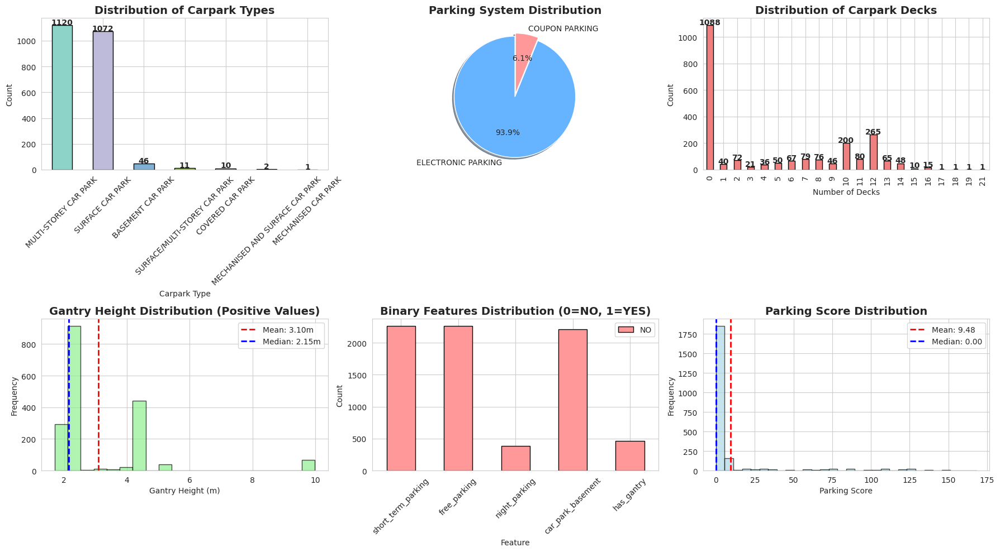


📊 Correlation Analysis...
Numerical columns: ['x_coord', 'y_coord', 'short_term_parking', 'free_parking', 'night_parking', 'car_park_decks', 'gantry_height', 'car_park_basement', 'has_gantry', 'postal_code', 'has_short_term', 'is_24hr_parking', 'parking_score']


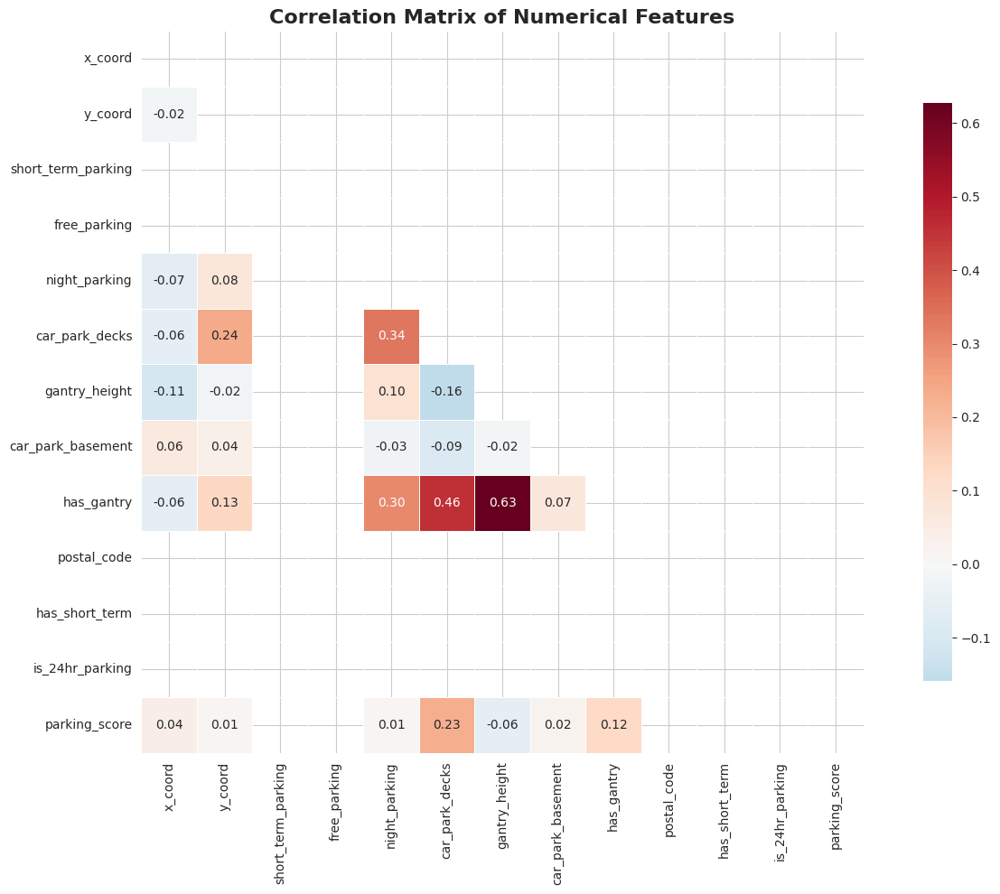


🗺️ Geographic Analysis...


✅ Interactive map created! Zoom in to see individual carparks.


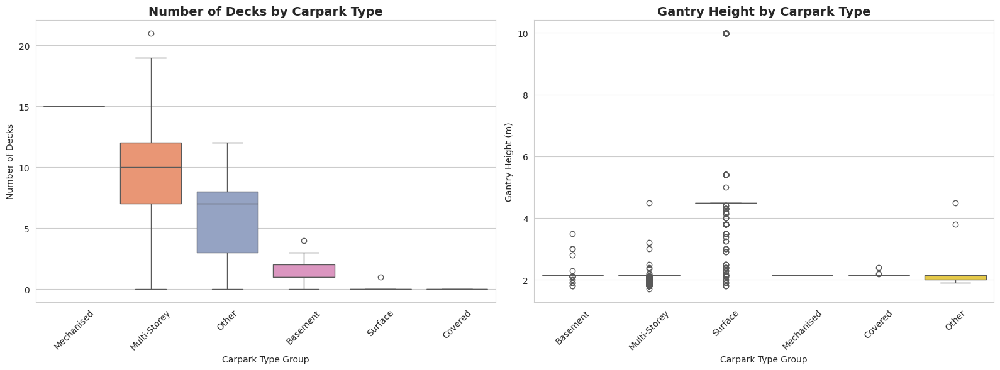

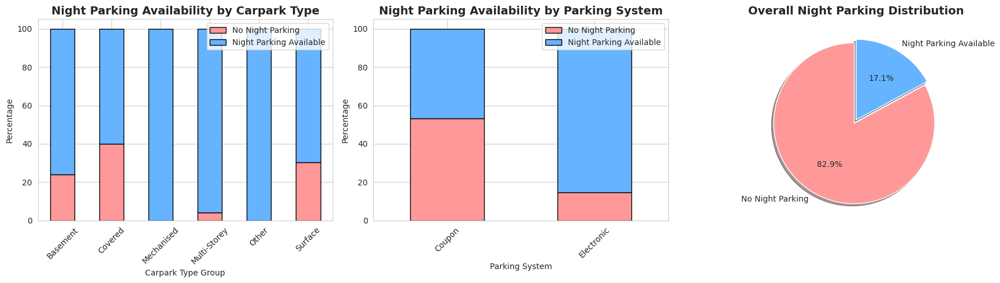

STEP 5: FEATURE ENGINEERING FOR MACHINE LEARNING

📌 Creating ML features...


TypeError: Cannot setitem on a Categorical with a new category (0), set the categories first

In [2]:
# -*- coding: utf-8 -*-
"""HDB_Carpark_Analysis_Fixed.ipynb

Automatically generated by Colaboratory.

# Singapore HDB Carpark Information Analysis
## Data Cleaning, Analysis, and Machine Learning Prediction (FIXED VERSION)
"""

# Install required packages
!pip install -q pandas numpy matplotlib seaborn scikit-learn xgboost lightgbm tensorflow folium plotly

"""## 1. Import Libraries"""

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import warnings
import os
import re
from google.colab import files
import io
import folium
from folium.plugins import MarkerCluster
import plotly.express as px
import plotly.graph_objects as go
from plotly.subplots import make_subplots

# Machine Learning Libraries
from sklearn.model_selection import train_test_split, cross_val_score, GridSearchCV, StratifiedKFold, learning_curve
from sklearn.preprocessing import LabelEncoder, StandardScaler, OneHotEncoder
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline
from sklearn.impute import SimpleImputer

# Classification Models
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier, AdaBoostClassifier
from sklearn.svm import SVC
from xgboost import XGBClassifier
from lightgbm import LGBMClassifier

# Deep Learning
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers, models, callbacks

# Metrics
from sklearn.metrics import (accuracy_score, precision_score, recall_score, f1_score,
                             confusion_matrix, classification_report, roc_auc_score,
                             roc_curve, auc, precision_recall_curve)

# Clustering
from sklearn.cluster import KMeans, DBSCAN
from sklearn.decomposition import PCA
from sklearn.metrics import silhouette_score

# Set style
warnings.filterwarnings('ignore')
sns.set_style('whitegrid')
plt.rcParams['figure.figsize'] = (12, 6)
pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', 100)

print("✅ All libraries imported successfully!")

"""## 2. Load and Upload Data"""

print("=" * 60)
print("STEP 1: LOADING DATA")
print("=" * 60)

# Load Dataset
try:
    df = pd.read_csv('HDBCarparkInformation.csv')
    print("✅ File loaded successfully from local directory!")
except FileNotFoundError:
    print("📁 File not found locally. Please upload the file:")
    from google.colab import files
    uploaded = files.upload()
    filename = list(uploaded.keys())[0]
    df = pd.read_csv(io.BytesIO(uploaded[filename]))
    print(f"✅ File '{filename}' uploaded and loaded successfully!")

print(f"\n📊 Dataset Shape: {df.shape}")
print(f"   Rows (records): {df.shape[0]:,}")
print(f"   Columns (features): {df.shape[1]}")

# Display first few rows
print("\n👁️ First 5 rows of the dataset:")
print(df.head())

"""## 3. Data Overview and Initial Exploration"""

print("=" * 60)
print("STEP 2: DATA OVERVIEW")
print("=" * 60)

# Basic info
print("\n📋 Dataset Info:")
print(df.info())

# Data types
print("\n📊 Data Types:")
print(df.dtypes)

# Statistical summary
print("\n📈 Statistical Summary (Numerical Columns):")
print(df.describe())

# Check for missing values
print("\n🔍 Missing Values:")
missing = df.isnull().sum()
print(missing[missing > 0] if any(missing > 0) else "No missing values found!")

# Check for duplicates
print(f"\n🔁 Duplicate rows: {df.duplicated().sum()}")

# Value counts for categorical columns
categorical_cols = df.select_dtypes(include=['object']).columns
print("\n🏷️ Categorical Columns Value Counts:")
for col in categorical_cols:
    print(f"\n{col}:")
    print(df[col].value_counts().head())

"""## 4. Data Cleaning"""

print("=" * 60)
print("STEP 3: DATA CLEANING")
print("=" * 60)

def clean_carpark_data(df):
    """
    Comprehensive data cleaning function for HDB Carpark data
    """
    df_clean = df.copy()

    # 1. Handle missing values
    print("\n📌 Handling missing values...")

    # For numerical columns, fill with median
    numerical_cols = df_clean.select_dtypes(include=[np.number]).columns.tolist()
    for col in numerical_cols:
        if df_clean[col].isnull().sum() > 0:
            df_clean[col].fillna(df_clean[col].median(), inplace=True)

    # For categorical columns, fill with mode
    categorical_cols = df_clean.select_dtypes(include=['object']).columns.tolist()
    for col in categorical_cols:
        if df_clean[col].isnull().sum() > 0:
            df_clean[col].fillna(df_clean[col].mode()[0] if not df_clean[col].mode().empty else 'Unknown', inplace=True)

    print("✅ Missing values handled!")

    # 2. Convert YES/NO columns to binary
    binary_columns = ['short_term_parking', 'free_parking', 'night_parking', 'car_park_basement']

    print("\n📌 Converting YES/NO columns to binary...")
    for col in binary_columns:
        if col in df_clean.columns:
            df_clean[col] = df_clean[col].map({'YES': 1, 'NO': 0, 'Y': 1, 'N': 0})
            print(f"✅ Converted {col}")

    # 3. Clean gantry_height - replace 0 with NaN and handle special values
    if 'gantry_height' in df_clean.columns:
        df_clean['gantry_height'] = pd.to_numeric(df_clean['gantry_height'], errors='coerce')
        df_clean['gantry_height'].fillna(0, inplace=True)
        df_clean['has_gantry'] = (df_clean['gantry_height'] > 0).astype(int)
        print("✅ Processed gantry_height")

    # 4. Extract information from address
    if 'address' in df_clean.columns:
        # Extract postal code if present (Singapore addresses often end with 6-digit)
        df_clean['postal_code'] = df_clean['address'].str.extract(r'(\d{6})$')

        # Extract block number
        df_clean['block_number'] = df_clean['address'].str.extract(r'BLK\s*(\d+[A-Z]*)', flags=re.IGNORECASE)

        print("✅ Extracted address features")

    # 5. Create derived features
    print("\n📌 Creating derived features...")

    # Carpark type groups
    type_mapping = {
        'MULTI-STOREY CAR PARK': 'Multi-Storey',
        'SURFACE CAR PARK': 'Surface',
        'BASEMENT CAR PARK': 'Basement',
        'MECHANISED CAR PARK': 'Mechanised',
        'COVERED CAR PARK': 'Covered'
    }
    df_clean['carpark_type_group'] = df_clean['car_park_type'].map(type_mapping).fillna('Other')

    # Parking system groups
    system_mapping = {
        'ELECTRONIC PARKING': 'Electronic',
        'COUPON PARKING': 'Coupon'
    }
    df_clean['parking_system_group'] = df_clean['type_of_parking_system'].map(system_mapping).fillna('Other')

    # Time-based features from short_term_parking
    df_clean['has_short_term'] = (df_clean['short_term_parking'] != 'NO').astype(int)
    df_clean['is_24hr_parking'] = (df_clean['short_term_parking'] == 'WHOLE DAY').astype(int)

    # Create a "parking availability score" (higher is better)
    df_clean['parking_score'] = (
        df_clean['car_park_decks'] * 10 +
        df_clean['has_short_term'] * 5 +
        df_clean['night_parking'] * 3 +
        df_clean['free_parking'] * 2 -
        df_clean['car_park_basement'] * 1
    )

    print("✅ Derived features created!")

    return df_clean

df_cleaned = clean_carpark_data(df)

print("\n" + "=" * 60)
print("CLEANED DATASET INFO")
print("=" * 60)
print(f"Shape: {df_cleaned.shape}")
print(f"\nColumns: {df_cleaned.columns.tolist()}")
print(f"\nData Types:\n{df_cleaned.dtypes}")

# Final check for missing values
print("\n🔍 Final check for missing values:")
nan_count = df_cleaned.isnull().sum().sum()
if nan_count > 0:
    print(f"⚠️ Warning: {nan_count} NaN values found! Filling with 0...")
    df_cleaned = df_cleaned.fillna(0)
    print("✅ All NaNs filled with 0")
else:
    print("✅ No missing values found!")

"""## 5. Exploratory Data Analysis (EDA)"""

print("=" * 60)
print("STEP 4: EXPLORATORY DATA ANALYSIS")
print("=" * 60)

### 5.1 Distribution of Carpark Types

fig, axes = plt.subplots(2, 3, figsize=(18, 10))

# 1. Carpark Type Distribution
ax1 = axes[0, 0]
type_counts = df_cleaned['car_park_type'].value_counts()
colors = plt.cm.Set3(np.linspace(0, 1, len(type_counts)))
type_counts.plot(kind='bar', ax=ax1, color=colors, edgecolor='black')
ax1.set_title('Distribution of Carpark Types', fontsize=14, fontweight='bold')
ax1.set_xlabel('Carpark Type')
ax1.set_ylabel('Count')
ax1.tick_params(axis='x', rotation=45)
for i, v in enumerate(type_counts):
    ax1.text(i, v + 5, str(v), ha='center', fontweight='bold')

# 2. Parking System Distribution
ax2 = axes[0, 1]
system_counts = df_cleaned['type_of_parking_system'].value_counts()
system_counts.plot(kind='pie', ax=ax2, autopct='%1.1f%%', colors=['#66b3ff', '#ff9999'],
                   explode=(0.05, 0), shadow=True, startangle=90)
ax2.set_title('Parking System Distribution', fontsize=14, fontweight='bold')
ax2.set_ylabel('')

# 3. Carpark Decks Distribution
ax3 = axes[0, 2]
deck_counts = df_cleaned['car_park_decks'].value_counts().sort_index()
deck_counts.plot(kind='bar', ax=ax3, color='lightcoral', edgecolor='black')
ax3.set_title('Distribution of Carpark Decks', fontsize=14, fontweight='bold')
ax3.set_xlabel('Number of Decks')
ax3.set_ylabel('Count')
for i, v in enumerate(deck_counts):
    ax3.text(i, v + 5, str(v), ha='center', fontweight='bold')

# 4. Gantry Height Distribution
ax4 = axes[1, 0]
gantry_positive = df_cleaned[df_cleaned['gantry_height'] > 0]['gantry_height']
ax4.hist(gantry_positive, bins=20, color='lightgreen', edgecolor='black', alpha=0.7)
ax4.set_title('Gantry Height Distribution (Positive Values)', fontsize=14, fontweight='bold')
ax4.set_xlabel('Gantry Height (m)')
ax4.set_ylabel('Frequency')
ax4.axvline(gantry_positive.mean(), color='red', linestyle='--', linewidth=2, label=f'Mean: {gantry_positive.mean():.2f}m')
ax4.axvline(gantry_positive.median(), color='blue', linestyle='--', linewidth=2, label=f'Median: {gantry_positive.median():.2f}m')
ax4.legend()

# 5. Binary Features Distribution
ax5 = axes[1, 1]
binary_features = ['short_term_parking', 'free_parking', 'night_parking', 'car_park_basement', 'has_gantry']
binary_counts = pd.DataFrame()
for feat in binary_features:
    if feat in df_cleaned.columns:
        binary_counts[feat] = df_cleaned[feat].value_counts().sort_index()

binary_counts.T.plot(kind='bar', ax=ax5, color=['#ff9999', '#66b3ff'], edgecolor='black')
ax5.set_title('Binary Features Distribution (0=NO, 1=YES)', fontsize=14, fontweight='bold')
ax5.set_xlabel('Feature')
ax5.set_ylabel('Count')
ax5.legend(['NO', 'YES'])
ax5.tick_params(axis='x', rotation=45)

# 6. Parking Score Distribution
ax6 = axes[1, 2]
ax6.hist(df_cleaned['parking_score'], bins=30, color='lightblue', edgecolor='black', alpha=0.7)
ax6.set_title('Parking Score Distribution', fontsize=14, fontweight='bold')
ax6.set_xlabel('Parking Score')
ax6.set_ylabel('Frequency')
ax6.axvline(df_cleaned['parking_score'].mean(), color='red', linestyle='--', linewidth=2,
            label=f'Mean: {df_cleaned["parking_score"].mean():.2f}')
ax6.axvline(df_cleaned['parking_score'].median(), color='blue', linestyle='--', linewidth=2,
            label=f'Median: {df_cleaned["parking_score"].median():.2f}')
ax6.legend()

plt.tight_layout()
plt.show()

### 5.2 Correlation Analysis

print("\n📊 Correlation Analysis...")

# Select numerical columns for correlation
numerical_cols = df_cleaned.select_dtypes(include=[np.number]).columns.tolist()
print(f"Numerical columns: {numerical_cols}")

# Correlation matrix
fig, ax = plt.subplots(figsize=(14, 10))
corr_matrix = df_cleaned[numerical_cols].corr()

# Create mask for upper triangle
mask = np.triu(np.ones_like(corr_matrix, dtype=bool))

# Heatmap
sns.heatmap(corr_matrix, mask=mask, annot=True, fmt='.2f', cmap='RdBu_r',
            center=0, square=True, linewidths=0.5, ax=ax, cbar_kws={"shrink": 0.8})
ax.set_title('Correlation Matrix of Numerical Features', fontsize=16, fontweight='bold')
plt.tight_layout()
plt.show()

### 5.3 Geographic Analysis

print("\n🗺️ Geographic Analysis...")

# Create a map of all carparks
if 'x_coord' in df_cleaned.columns and 'y_coord' in df_cleaned.columns:
    # Convert SVY21 coordinates to approximate lat/lon (simplified conversion)
    # This is a rough approximation - in production, use proper SVY21 to WGS84 conversion
    df_cleaned['approx_lat'] = 1.29 + (df_cleaned['y_coord'] - 30000) / 111000
    df_cleaned['approx_lon'] = 103.85 + (df_cleaned['x_coord'] - 30000) / (111000 * np.cos(1.29))

    # Create interactive map with folium
    m = folium.Map(location=[1.3521, 103.8198], zoom_start=11, control_scale=True)

    # Add marker cluster
    marker_cluster = MarkerCluster().add_to(m)

    # Add markers for each carpark
    for idx, row in df_cleaned.iterrows():
        if pd.notna(row['approx_lat']) and pd.notna(row['approx_lon']):
            # Choose color based on carpark type
            if 'MULTI-STOREY' in row['car_park_type']:
                color = 'red'
                icon = 'building'
            elif 'SURFACE' in row['car_park_type']:
                color = 'green'
                icon = 'tree'
            elif 'BASEMENT' in row['car_park_type']:
                color = 'blue'
                icon = 'arrow-down'
            else:
                color = 'orange'
                icon = 'info-sign'

            # Create popup text
            popup_text = f"""
            <b>Car Park No:</b> {row['car_park_no']}<br>
            <b>Address:</b> {row['address']}<br>
            <b>Type:</b> {row['car_park_type']}<br>
            <b>Decks:</b> {row['car_park_decks']}<br>
            <b>Gantry Height:</b> {row['gantry_height']}m<br>
            <b>Night Parking:</b> {'Yes' if row['night_parking'] == 1 else 'No'}
            """

            folium.Marker(
                location=[row['approx_lat'], row['approx_lon']],
                popup=folium.Popup(popup_text, max_width=300),
                icon=folium.Icon(color=color, icon=icon, prefix='fa')
            ).add_to(marker_cluster)

    # Display map
    display(m)

    print("✅ Interactive map created! Zoom in to see individual carparks.")

### 5.4 Carpark Type Analysis by Decks and Gantry Height

fig, axes = plt.subplots(1, 2, figsize=(16, 6))

# Box plot of decks by carpark type
ax1 = axes[0]
type_order = df_cleaned.groupby('carpark_type_group')['car_park_decks'].mean().sort_values(ascending=False).index
sns.boxplot(data=df_cleaned, x='carpark_type_group', y='car_park_decks',
            order=type_order, palette='Set2', ax=ax1)
ax1.set_title('Number of Decks by Carpark Type', fontsize=14, fontweight='bold')
ax1.set_xlabel('Carpark Type Group')
ax1.set_ylabel('Number of Decks')
ax1.tick_params(axis='x', rotation=45)

# Box plot of gantry height by carpark type (only positive values)
ax2 = axes[1]
positive_gantry = df_cleaned[df_cleaned['gantry_height'] > 0]
sns.boxplot(data=positive_gantry, x='carpark_type_group', y='gantry_height',
            palette='Set2', ax=ax2)
ax2.set_title('Gantry Height by Carpark Type', fontsize=14, fontweight='bold')
ax2.set_xlabel('Carpark Type Group')
ax2.set_ylabel('Gantry Height (m)')
ax2.tick_params(axis='x', rotation=45)

plt.tight_layout()
plt.show()

### 5.5 Night Parking Analysis

fig, axes = plt.subplots(1, 3, figsize=(18, 5))

# 1. Night parking by carpark type
ax1 = axes[0]
night_by_type = pd.crosstab(df_cleaned['carpark_type_group'], df_cleaned['night_parking'], normalize='index') * 100
night_by_type.plot(kind='bar', stacked=True, ax=ax1, color=['#ff9999', '#66b3ff'], edgecolor='black')
ax1.set_title('Night Parking Availability by Carpark Type', fontsize=14, fontweight='bold')
ax1.set_xlabel('Carpark Type Group')
ax1.set_ylabel('Percentage')
ax1.legend(['No Night Parking', 'Night Parking Available'], loc='upper right')
ax1.tick_params(axis='x', rotation=45)

# 2. Night parking by parking system
ax2 = axes[1]
night_by_system = pd.crosstab(df_cleaned['parking_system_group'], df_cleaned['night_parking'], normalize='index') * 100
night_by_system.plot(kind='bar', stacked=True, ax=ax2, color=['#ff9999', '#66b3ff'], edgecolor='black')
ax2.set_title('Night Parking Availability by Parking System', fontsize=14, fontweight='bold')
ax2.set_xlabel('Parking System')
ax2.set_ylabel('Percentage')
ax2.legend(['No Night Parking', 'Night Parking Available'], loc='upper right')
ax2.tick_params(axis='x', rotation=45)

# 3. Night parking count
ax3 = axes[2]
night_counts = df_cleaned['night_parking'].value_counts()
ax3.pie(night_counts, labels=['No Night Parking', 'Night Parking Available'],
        autopct='%1.1f%%', colors=['#ff9999', '#66b3ff'], explode=(0.05, 0), shadow=True, startangle=90)
ax3.set_title('Overall Night Parking Distribution', fontsize=14, fontweight='bold')

plt.tight_layout()
plt.show()

"""## 6. Feature Engineering for Machine Learning"""

print("=" * 60)
print("STEP 5: FEATURE ENGINEERING FOR MACHINE LEARNING")
print("=" * 60)

def create_ml_features(df):
    """
    Create features specifically for machine learning models
    """
    df_ml = df.copy()

    print("\n📌 Creating ML features...")

    # 1. Target variable: Create a classification target
    # Let's predict if a carpark has night parking (1) or not (0)
    df_ml['target_night_parking'] = df_ml['night_parking']

    # Alternative target: Predict if carpark has multiple decks (>0)
    df_ml['target_has_decks'] = (df_ml['car_park_decks'] > 0).astype(int)

    # 2. Encode categorical variables
    le_type = LabelEncoder()
    df_ml['carpark_type_encoded'] = le_type.fit_transform(df_ml['car_park_type'])

    le_system = LabelEncoder()
    df_ml['parking_system_encoded'] = le_system.fit_transform(df_ml['type_of_parking_system'])

    le_type_group = LabelEncoder()
    df_ml['carpark_type_group_encoded'] = le_type_group.fit_transform(df_ml['carpark_type_group'])

    le_system_group = LabelEncoder()
    df_ml['parking_system_group_encoded'] = le_system_group.fit_transform(df_ml['parking_system_group'])

    # 3. Create interaction features
    df_ml['decks_gantry_interaction'] = df_ml['car_park_decks'] * df_ml['gantry_height']
    df_ml['type_system_interaction'] = df_ml['carpark_type_encoded'] * df_ml['parking_system_encoded']

    # 4. Location-based features (if coordinates available)
    if 'x_coord' in df_ml.columns and 'y_coord' in df_ml.columns:
        # Distance from city center (approximate)
        city_center_x, city_center_y = 30300, 31700  # Approximate Raffles Place
        df_ml['distance_from_city'] = np.sqrt(
            (df_ml['x_coord'] - city_center_x)**2 +
            (df_ml['y_coord'] - city_center_y)**2
        ) / 1000  # Convert to km

        # Region based on coordinates
        df_ml['region_x'] = pd.cut(df_ml['x_coord'], bins=5, labels=['West', 'Central-West', 'Central', 'Central-East', 'East'])
        df_ml['region_y'] = pd.cut(df_ml['y_coord'], bins=5, labels=['South', 'South-Central', 'Central', 'North-Central', 'North'])

        # Encode regions
        le_region_x = LabelEncoder()
        df_ml['region_x_encoded'] = le_region_x.fit_transform(df_ml['region_x'].astype(str))

        le_region_y = LabelEncoder()
        df_ml['region_y_encoded'] = le_region_y.fit_transform(df_ml['region_y'].astype(str))

    # 5. Binary features sum (amenities count)
    binary_cols = ['short_term_parking', 'free_parking', 'night_parking', 'car_park_basement', 'has_gantry', 'is_24hr_parking']
    existing_binary = [col for col in binary_cols if col in df_ml.columns]
    df_ml['amenities_count'] = df_ml[existing_binary].sum(axis=1)

    # 6. Text features from address
    if 'address' in df_ml.columns:
        # Check if address contains specific keywords
        df_ml['has_road'] = df_ml['address'].str.contains('ROAD|RD|LANE|DRIVE|DR|AVENUE|AVE', case=False, na=False).astype(int)
        df_ml['has_central'] = df_ml['address'].str.contains('CENTRAL', case=False, na=False).astype(int)

        # Address length as a feature
        df_ml['address_length'] = df_ml['address'].str.len()

    # 7. Fill any NaN values created during feature engineering
    df_ml = df_ml.fillna(0)

    print(f"✅ Created {len(df_ml.columns) - len(df.columns)} new features")
    print(f"📊 Total features now: {len(df_ml.columns)}")

    return df_ml, {
        'type_encoder': le_type,
        'system_encoder': le_system,
        'type_group_encoder': le_type_group,
        'system_group_encoder': le_system_group
    }

# Apply feature engineering
df_ml, encoders = create_ml_features(df_cleaned)

print("\n📋 New columns added:")
new_cols = set(df_ml.columns) - set(df_cleaned.columns)
for col in sorted(new_cols):
    print(f"  - {col}")

# Final NaN check after feature engineering
print("\n🔍 Final NaN check after feature engineering:")
nan_count = df_ml.isnull().sum().sum()
if nan_count > 0:
    print(f"⚠️ Warning: {nan_count} NaN values found! Filling with 0...")
    df_ml = df_ml.fillna(0)
    print("✅ All NaNs filled with 0")
else:
    print("✅ No missing values found!")

"""## 7. Prepare Data for Machine Learning"""

print("=" * 60)
print("STEP 6: DATA PREPARATION FOR MACHINE LEARNING")
print("=" * 60)

def prepare_ml_data(df, target_col='target_night_parking'):
    """
    Prepare data for machine learning models
    """
    # Define features to drop (identifiers, original categorical, target)
    cols_to_drop = [
        'car_park_no', 'address', 'car_park_type', 'type_of_parking_system',
        'short_term_parking', 'free_parking', 'night_parking', 'target_night_parking',
        'target_has_decks', 'carpark_type_group', 'parking_system_group',
        'region_x', 'region_y', 'postal_code', 'block_number'
    ]

    # Add coordinate columns if they exist
    for col in ['x_coord', 'y_coord', 'approx_lat', 'approx_lon']:
        if col in df.columns:
            cols_to_drop.append(col)

    # Separate features and target
    X = df.drop(columns=[col for col in cols_to_drop if col in df.columns])
    y = df[target_col]

    # Ensure no NaN values in features
    if X.isnull().sum().sum() > 0:
        print("⚠️ NaN values found in features! Filling with 0...")
        X = X.fillna(0)

    print(f"\n📊 Feature matrix shape: {X.shape}")
    print(f"🎯 Target vector shape: {y.shape}")
    print(f"\n📈 Target distribution:\n{y.value_counts()}")
    print(f"Target distribution (%):\n{y.value_counts(normalize=True) * 100}")

    # Split data
    X_train, X_test, y_train, y_test = train_test_split(
        X, y, test_size=0.2, random_state=42, stratify=y
    )

    print(f"\n🚂 Train set: {X_train.shape}")
    print(f"🧪 Test set: {X_test.shape}")

    # Scale numerical features
    scaler = StandardScaler()
    X_train_scaled = X_train.copy()
    X_test_scaled = X_test.copy()

    numerical_cols = X.select_dtypes(include=[np.number]).columns.tolist()
    X_train_scaled[numerical_cols] = scaler.fit_transform(X_train[numerical_cols])
    X_test_scaled[numerical_cols] = scaler.transform(X_test[numerical_cols])

    # Final NaN check after scaling
    if X_train_scaled.isnull().sum().sum() > 0:
        print("⚠️ NaN values found after scaling! Filling with 0...")
        X_train_scaled = X_train_scaled.fillna(0)
        X_test_scaled = X_test_scaled.fillna(0)

    print(f"\n✅ Features scaled: {len(numerical_cols)} numerical columns")
    print("✅ No NaN values in training data")

    return X_train_scaled, X_test_scaled, y_train, y_test, scaler, X.columns.tolist()

# Prepare data for night parking prediction
X_train, X_test, y_train, y_test, scaler, feature_names = prepare_ml_data(df_ml, target_col='target_night_parking')

print("\n📋 Feature names:")
for i, feat in enumerate(feature_names[:10]):
    print(f"  {i+1}. {feat}")
if len(feature_names) > 10:
    print(f"  ... and {len(feature_names) - 10} more")

"""## 8. Machine Learning Models - Training and Evaluation"""

print("=" * 60)
print("STEP 7: MACHINE LEARNING MODEL TRAINING")
print("=" * 60)

def train_evaluate_models(X_train, y_train, X_test, y_test):
    """
    Train multiple ML models and evaluate performance
    """
    # Calculate scale_pos_weight for XGBoost
    scale_pos_weight = len(y_train[y_train==0]) / len(y_train[y_train==1]) if len(y_train[y_train==1]) > 0 else 1

    models = {
        'Logistic Regression': LogisticRegression(max_iter=1000, random_state=42, class_weight='balanced'),
        'Decision Tree': DecisionTreeClassifier(random_state=42, class_weight='balanced', max_depth=10),
        'Random Forest': RandomForestClassifier(random_state=42, class_weight='balanced', n_estimators=100, n_jobs=-1),
        'Gradient Boosting': GradientBoostingClassifier(random_state=42, n_estimators=100),
        'AdaBoost': AdaBoostClassifier(random_state=42, n_estimators=100),
        'XGBoost': XGBClassifier(random_state=42, use_label_encoder=False, eval_metric='logloss', scale_pos_weight=scale_pos_weight),
        'LightGBM': LGBMClassifier(random_state=42, verbose=-1, class_weight='balanced')
    }

    results = []
    trained_models = {}
    best_model = None
    best_f1 = 0
    best_model_name = None

    for name, model in models.items():
        print(f"\n{'-'*50}")
        print(f"Training {name}...")

        try:
            # Train model
            model.fit(X_train, y_train)
            trained_models[name] = model

            # Predictions
            y_pred = model.predict(X_test)
            y_pred_proba = model.predict_proba(X_test)[:, 1] if hasattr(model, 'predict_proba') else None

            # Metrics
            accuracy = accuracy_score(y_test, y_pred)
            precision = precision_score(y_test, y_pred, zero_division=0)
            recall = recall_score(y_test, y_pred, zero_division=0)
            f1 = f1_score(y_test, y_pred, zero_division=0)

            if y_pred_proba is not None:
                auc = roc_auc_score(y_test, y_pred_proba)
            else:
                auc = 0

            # Store results
            results.append({
                'Model': name,
                'Accuracy': accuracy,
                'Precision': precision,
                'Recall': recall,
                'F1 Score': f1,
                'AUC-ROC': auc
            })

            print(f"✅ Accuracy: {accuracy:.4f}")
            print(f"✅ Precision: {precision:.4f}")
            print(f"✅ Recall: {recall:.4f}")
            print(f"✅ F1 Score: {f1:.4f}")
            print(f"✅ AUC-ROC: {auc:.4f}")

            # Track best model based on F1 score
            if f1 > best_f1:
                best_f1 = f1
                best_model = model
                best_model_name = name

        except Exception as e:
            print(f"❌ Error training {name}: {e}")
            continue

    # Create results DataFrame
    if results:
        results_df = pd.DataFrame(results)
        results_df = results_df.sort_values('F1 Score', ascending=False)

        print("\n" + "=" * 60)
        print("MODEL COMPARISON SUMMARY")
        print("=" * 60)
        print(results_df.to_string(index=False))
    else:
        results_df = pd.DataFrame()
        print("❌ No models were successfully trained!")

    return results_df, best_model, best_model_name, trained_models

# Train models
results_df, best_model, best_model_name, trained_models = train_evaluate_models(
    X_train, y_train, X_test, y_test
)

"""## 9. Model Performance Visualization"""

print("=" * 60)
print("STEP 8: MODEL PERFORMANCE VISUALIZATION")
print("=" * 60)

def visualize_model_performance(results_df, X_test, y_test, best_model, best_model_name, feature_names):
    """
    Create comprehensive visualizations of model performance
    """
    if results_df.empty or best_model is None:
        print("⚠️ No models to visualize!")
        return

    fig = plt.figure(figsize=(20, 15))

    # 1. Model Comparison Bar Plot
    ax1 = plt.subplot(3, 3, 1)
    metrics = ['Accuracy', 'Precision', 'Recall', 'F1 Score', 'AUC-ROC']
    results_melted = results_df.melt(id_vars=['Model'], value_vars=metrics,
                                      var_name='Metric', value_name='Score')

    sns.barplot(data=results_melted, x='Model', y='Score', hue='Metric', ax=ax1)
    ax1.set_title('Model Performance Comparison', fontsize=14, fontweight='bold')
    ax1.tick_params(axis='x', rotation=45)
    ax1.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
    ax1.set_ylim(0, 1)

    # 2. Confusion Matrix for Best Model
    ax2 = plt.subplot(3, 3, 2)
    y_pred_best = best_model.predict(X_test)
    cm = confusion_matrix(y_test, y_pred_best)
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', ax=ax2, cbar=False,
                xticklabels=['No Night Parking', 'Night Parking'],
                yticklabels=['No Night Parking', 'Night Parking'])
    ax2.set_title(f'Confusion Matrix - {best_model_name}', fontsize=14, fontweight='bold')
    ax2.set_xlabel('Predicted')
    ax2.set_ylabel('Actual')

    # 3. ROC Curve
    ax3 = plt.subplot(3, 3, 3)
    if hasattr(best_model, 'predict_proba'):
        y_pred_proba = best_model.predict_proba(X_test)[:, 1]
        fpr, tpr, _ = roc_curve(y_test, y_pred_proba)
        auc_score = roc_auc_score(y_test, y_pred_proba)

        ax3.plot(fpr, tpr, linewidth=2, label=f'{best_model_name} (AUC = {auc_score:.3f})')
        ax3.plot([0, 1], [0, 1], 'k--', linewidth=1, label='Random Classifier')
        ax3.set_xlabel('False Positive Rate')
        ax3.set_ylabel('True Positive Rate')
        ax3.set_title('ROC Curve', fontsize=14, fontweight='bold')
        ax3.legend(loc='lower right')
        ax3.grid(True, alpha=0.3)

    # 4. Feature Importance (for tree-based models)
    ax4 = plt.subplot(3, 3, 4)
    if hasattr(best_model, 'feature_importances_'):
        importance_df = pd.DataFrame({
            'feature': feature_names,
            'importance': best_model.feature_importances_
        }).sort_values('importance', ascending=False).head(10)

        sns.barplot(data=importance_df, y='feature', x='importance', ax=ax4, palette='viridis')
        ax4.set_title(f'Top 10 Feature Importances - {best_model_name}', fontsize=14, fontweight='bold')
        ax4.set_xlabel('Importance')
        ax4.set_ylabel('Feature')

    # 5. Precision-Recall Curve
    ax5 = plt.subplot(3, 3, 5)
    if hasattr(best_model, 'predict_proba'):
        precision_vals, recall_vals, _ = precision_recall_curve(y_test, y_pred_proba)

        ax5.plot(recall_vals, precision_vals, linewidth=2, color='purple')
        ax5.set_xlabel('Recall')
        ax5.set_ylabel('Precision')
        ax5.set_title('Precision-Recall Curve', fontsize=14, fontweight='bold')
        ax5.grid(True, alpha=0.3)

    # 6. Classification Report Heatmap
    ax6 = plt.subplot(3, 3, 6)
    report = classification_report(y_test, y_pred_best, output_dict=True)
    report_df = pd.DataFrame(report).iloc[:-1, :3]  # Remove support row

    sns.heatmap(report_df, annot=True, fmt='.3f', cmap='YlOrRd', ax=ax6, cbar=False)
    ax6.set_title('Classification Report', fontsize=14, fontweight='bold')

    # 7. Prediction Distribution
    ax7 = plt.subplot(3, 3, 7)
    pred_counts = pd.Series(y_pred_best).value_counts()
    actual_counts = y_test.value_counts()

    x = np.arange(2)
    width = 0.35
    ax7.bar(x - width/2, [actual_counts.get(0, 0), actual_counts.get(1, 0)], width, label='Actual', color='lightblue')
    ax7.bar(x + width/2, [pred_counts.get(0, 0), pred_counts.get(1, 0)], width, label='Predicted', color='lightcoral')
    ax7.set_xlabel('Class')
    ax7.set_ylabel('Count')
    ax7.set_title('Actual vs Predicted Distribution', fontsize=14, fontweight='bold')
    ax7.set_xticks(x)
    ax7.set_xticklabels(['No Night Parking', 'Night Parking'])
    ax7.legend()

    # 8. Model Performance Summary
    ax8 = plt.subplot(3, 3, 8)
    ax8.axis('off')
    summary_text = f"🏆 BEST MODEL: {best_model_name}\n\n"
    summary_text += f"📊 Performance Metrics:\n"
    summary_text += f"   Accuracy:  {results_df.iloc[0]['Accuracy']:.4f}\n"
    summary_text += f"   Precision: {results_df.iloc[0]['Precision']:.4f}\n"
    summary_text += f"   Recall:    {results_df.iloc[0]['Recall']:.4f}\n"
    summary_text += f"   F1 Score:  {results_df.iloc[0]['F1 Score']:.4f}\n"
    summary_text += f"   AUC-ROC:   {results_df.iloc[0]['AUC-ROC']:.4f}"

    ax8.text(0.1, 0.5, summary_text, fontsize=14, va='center', family='monospace',
             bbox=dict(boxstyle='round', facecolor='lightyellow', alpha=0.8))

    # 9. Learning Curves (simplified)
    ax9 = plt.subplot(3, 3, 9)
    try:
        train_sizes, train_scores, test_scores = learning_curve(
            best_model, X_train, y_train, cv=3, n_jobs=-1,
            train_sizes=np.linspace(0.1, 1.0, 5), scoring='f1'
        )

        train_mean = np.mean(train_scores, axis=1)
        train_std = np.std(train_scores, axis=1)
        test_mean = np.mean(test_scores, axis=1)
        test_std = np.std(test_scores, axis=1)

        ax9.fill_between(train_sizes, train_mean - train_std, train_mean + train_std, alpha=0.1, color='blue')
        ax9.fill_between(train_sizes, test_mean - test_std, test_mean + test_std, alpha=0.1, color='orange')
        ax9.plot(train_sizes, train_mean, 'o-', color='blue', label='Training Score')
        ax9.plot(train_sizes, test_mean, 'o-', color='orange', label='Cross-validation Score')
        ax9.set_xlabel('Training Examples')
        ax9.set_ylabel('F1 Score')
        ax9.set_title('Learning Curves', fontsize=14, fontweight='bold')
        ax9.legend(loc='lower right')
        ax9.grid(True, alpha=0.3)
    except:
        ax9.text(0.5, 0.5, 'Learning Curve\nNot Available', ha='center', va='center', fontsize=14)
        ax9.set_title('Learning Curves', fontsize=14, fontweight='bold')

    plt.tight_layout()
    plt.show()

# Visualize performance
if best_model is not None:
    visualize_model_performance(results_df, X_test, y_test, best_model, best_model_name, feature_names)
else:
    print("⚠️ No best model found. Skipping visualization.")

"""## 10. Hyperparameter Tuning for Best Model"""

print("=" * 60)
print("STEP 9: HYPERPARAMETER TUNING")
print("=" * 60)

def tune_best_model(X_train, y_train, X_test, y_test, best_model_name, trained_models):
    """
    Perform hyperparameter tuning for the best performing model
    """
    print(f"\n🔧 Tuning {best_model_name}...")

    # Define parameter grids for different models
    param_grids = {
        'Random Forest': {
            'n_estimators': [50, 100, 200],
            'max_depth': [5, 10, 20, None],
            'min_samples_split': [2, 5, 10],
            'min_samples_leaf': [1, 2, 4]
        },
        'XGBoost': {
            'n_estimators': [50, 100, 200],
            'max_depth': [3, 5, 7],
            'learning_rate': [0.01, 0.1, 0.2],
            'subsample': [0.8, 1.0]
        },
        'LightGBM': {
            'n_estimators': [50, 100, 200],
            'max_depth': [5, 10, -1],
            'learning_rate': [0.01, 0.1, 0.2],
            'num_leaves': [15, 31, 50]
        },
        'Gradient Boosting': {
            'n_estimators': [50, 100, 200],
            'max_depth': [3, 5, 7],
            'learning_rate': [0.01, 0.1, 0.2]
        },
        'Decision Tree': {
            'max_depth': [3, 5, 10, 15, None],
            'min_samples_split': [2, 5, 10],
            'min_samples_leaf': [1, 2, 4]
        }
    }

    # Find matching model
    matching_key = None
    for key in param_grids.keys():
        if key in best_model_name:
            matching_key = key
            break

    if matching_key is None:
        print(f"⚠️ No tuning defined for {best_model_name}. Using default parameters.")
        return trained_models.get(best_model_name), None

    # Get the model
    model = trained_models.get(best_model_name)
    if model is None:
        print(f"❌ Model {best_model_name} not found!")
        return None, None

    # Perform grid search
    cv = StratifiedKFold(n_splits=3, shuffle=True, random_state=42)

    grid_search = GridSearchCV(
        estimator=model.__class__(**model.get_params()),
        param_grid=param_grids[matching_key],
        cv=cv,
        scoring='f1',
        n_jobs=-1,
        verbose=1
    )

    print(f"\n⏳ Starting Grid Search...")
    grid_search.fit(X_train, y_train)

    print(f"\n✅ Best parameters: {grid_search.best_params_}")
    print(f"📈 Best cross-validation F1 score: {grid_search.best_score_:.4f}")

    # Evaluate on test set
    best_tuned_model = grid_search.best_estimator_
    y_pred = best_tuned_model.predict(X_test)
    y_pred_proba = best_tuned_model.predict_proba(X_test)[:, 1]

    test_f1 = f1_score(y_test, y_pred)
    test_auc = roc_auc_score(y_test, y_pred_proba)

    print(f"\n📊 Test set performance:")
    print(f"   F1 Score: {test_f1:.4f}")
    print(f"   AUC-ROC:  {test_auc:.4f}")

    return best_tuned_model, grid_search.best_params_

# Tune the best model
if best_model_name is not None:
    best_tuned_model, best_params = tune_best_model(
        X_train, y_train, X_test, y_test, best_model_name, trained_models
    )
    if best_tuned_model is not None:
        best_model = best_tuned_model
else:
    best_params = None

"""## 11. Deep Learning Model (Neural Network)"""

print("=" * 60)
print("STEP 10: DEEP LEARNING MODEL")
print("=" * 60)

def create_deep_learning_model(input_dim):
    """
    Create a neural network for binary classification
    """
    model = models.Sequential([
        layers.Input(shape=(input_dim,)),
        layers.Dense(64, activation='relu', kernel_regularizer=tf.keras.regularizers.l2(0.001)),
        layers.BatchNormalization(),
        layers.Dropout(0.3),

        layers.Dense(32, activation='relu', kernel_regularizer=tf.keras.regularizers.l2(0.001)),
        layers.BatchNormalization(),
        layers.Dropout(0.3),

        layers.Dense(16, activation='relu'),
        layers.Dense(1, activation='sigmoid')
    ])

    model.compile(
        optimizer=tf.keras.optimizers.Adam(learning_rate=0.001),
        loss='binary_crossentropy',
        metrics=['accuracy', tf.keras.metrics.Precision(), tf.keras.metrics.Recall(), tf.keras.metrics.AUC()]
    )

    return model

print(f"\n🧠 Creating neural network with input dimension: {X_train.shape[1]}")

# Create the model
dl_model = create_deep_learning_model(X_train.shape[1])
dl_model.summary()

# Callbacks
early_stopping = callbacks.EarlyStopping(
    monitor='val_loss',
    patience=20,
    restore_best_weights=True,
    verbose=1
)

reduce_lr = callbacks.ReduceLROnPlateau(
    monitor='val_loss',
    factor=0.5,
    patience=10,
    min_lr=0.00001,
    verbose=1
)

# Train the model
print("\n⏳ Training neural network...")
history = dl_model.fit(
    X_train, y_train,
    validation_split=0.2,
    epochs=100,
    batch_size=32,
    callbacks=[early_stopping, reduce_lr],
    verbose=1
)

# Evaluate on test set
print("\n📊 Evaluating on test set...")
dl_test_loss, dl_test_acc, dl_test_precision, dl_test_recall, dl_test_auc = dl_model.evaluate(X_test, y_test, verbose=0)

print(f"\n✅ Deep Learning Test Results:")
print(f"   Accuracy:  {dl_test_acc:.4f}")
print(f"   Precision: {dl_test_precision:.4f}")
print(f"   Recall:    {dl_test_recall:.4f}")
print(f"   AUC-ROC:   {dl_test_auc:.4f}")

# Make predictions
dl_pred_proba = dl_model.predict(X_test).flatten()
dl_pred = (dl_pred_proba > 0.5).astype(int)
dl_f1 = f1_score(y_test, dl_pred)

print(f"   F1 Score:  {dl_f1:.4f}")

# Add deep learning to results
dl_result = {
    'Model': 'Deep Learning (Neural Network)',
    'Accuracy': dl_test_acc,
    'Precision': dl_test_precision,
    'Recall': dl_test_recall,
    'F1 Score': dl_f1,
    'AUC-ROC': dl_test_auc
}
results_df = pd.concat([results_df, pd.DataFrame([dl_result])], ignore_index=True)
results_df = results_df.sort_values('F1 Score', ascending=False)

print("\n" + "=" * 60)
print("UPDATED MODEL COMPARISON (with Deep Learning)")
print("=" * 60)
print(results_df.to_string(index=False))

# Plot training history
fig, axes = plt.subplots(1, 2, figsize=(15, 5))

# Loss plot
ax1 = axes[0]
ax1.plot(history.history['loss'], label='Training Loss', linewidth=2)
ax1.plot(history.history['val_loss'], label='Validation Loss', linewidth=2)
ax1.set_xlabel('Epochs')
ax1.set_ylabel('Loss')
ax1.set_title('Model Loss During Training', fontsize=14, fontweight='bold')
ax1.legend()
ax1.grid(True, alpha=0.3)

# Accuracy plot
ax2 = axes[1]
ax2.plot(history.history['accuracy'], label='Training Accuracy', linewidth=2)
ax2.plot(history.history['val_accuracy'], label='Validation Accuracy', linewidth=2)
ax2.set_xlabel('Epochs')
ax2.set_ylabel('Accuracy')
ax2.set_title('Model Accuracy During Training', fontsize=14, fontweight='bold')
ax2.legend()
ax2.grid(True, alpha=0.3)

plt.tight_layout()
plt.show()

"""## 12. Clustering Analysis"""

print("=" * 60)
print("STEP 11: CLUSTERING ANALYSIS")
print("=" * 60)

# Prepare data for clustering
clustering_features = ['car_park_decks', 'gantry_height', 'amenities_count', 'parking_score']
if 'distance_from_city' in df_ml.columns:
    clustering_features.append('distance_from_city')

X_cluster = df_ml[clustering_features].copy()
X_cluster_scaled = StandardScaler().fit_transform(X_cluster)

# Find optimal number of clusters using Elbow method
inertias = []
silhouette_scores = []
K_range = range(2, 11)

for k in K_range:
    kmeans = KMeans(n_clusters=k, random_state=42, n_init=10)
    kmeans.fit(X_cluster_scaled)
    inertias.append(kmeans.inertia_)
    silhouette_scores.append(silhouette_score(X_cluster_scaled, kmeans.labels_))

# Plot elbow curve
fig, axes = plt.subplots(1, 2, figsize=(15, 5))

ax1 = axes[0]
ax1.plot(K_range, inertias, 'bo-', linewidth=2, markersize=8)
ax1.set_xlabel('Number of Clusters (k)')
ax1.set_ylabel('Inertia')
ax1.set_title('Elbow Method for Optimal k', fontsize=14, fontweight='bold')
ax1.grid(True, alpha=0.3)

ax2 = axes[1]
ax2.plot(K_range, silhouette_scores, 'ro-', linewidth=2, markersize=8)
ax2.set_xlabel('Number of Clusters (k)')
ax2.set_ylabel('Silhouette Score')
ax2.set_title('Silhouette Score for Optimal k', fontsize=14, fontweight='bold')
ax2.grid(True, alpha=0.3)

plt.tight_layout()
plt.show()

# Choose optimal k (based on silhouette score)
optimal_k = K_range[np.argmax(silhouette_scores)]
print(f"\n✅ Optimal number of clusters: {optimal_k} (based on silhouette score)")

# Perform K-means with optimal k
kmeans_final = KMeans(n_clusters=optimal_k, random_state=42, n_init=10)
cluster_labels = kmeans_final.fit_predict(X_cluster_scaled)

# Add cluster labels to dataframe
df_ml['cluster'] = cluster_labels

# Analyze clusters
print("\n📊 Cluster Analysis:")
for i in range(optimal_k):
    cluster_data = df_ml[df_ml['cluster'] == i]
    print(f"\n🔹 Cluster {i}: {len(cluster_data)} carparks ({len(cluster_data)/len(df_ml)*100:.1f}%)")
    print(f"   Average decks: {cluster_data['car_park_decks'].mean():.2f}")
    print(f"   Average gantry height: {cluster_data['gantry_height'].mean():.2f}m")
    print(f"   Average amenities: {cluster_data['amenities_count'].mean():.2f}")
    print(f"   Average parking score: {cluster_data['parking_score'].mean():.2f}")

    # Most common carpark type in this cluster
    top_type = cluster_data['car_park_type'].mode()[0] if not cluster_data['car_park_type'].empty else 'Unknown'
    print(f"   Most common type: {top_type}")

# Visualize clusters with PCA
pca = PCA(n_components=2)
X_pca = pca.fit_transform(X_cluster_scaled)

fig, ax = plt.subplots(figsize=(12, 8))
scatter = ax.scatter(X_pca[:, 0], X_pca[:, 1], c=cluster_labels, cmap='viridis',
                     s=50, alpha=0.6, edgecolors='black', linewidth=0.5)
ax.set_title(f'Carpark Clusters (k={optimal_k}) - PCA Visualization', fontsize=16, fontweight='bold')
ax.set_xlabel(f'PC1 ({pca.explained_variance_ratio_[0]*100:.1f}% variance)')
ax.set_ylabel(f'PC2 ({pca.explained_variance_ratio_[1]*100:.1f}% variance)')
plt.colorbar(scatter, label='Cluster')
plt.tight_layout()
plt.show()

"""## 13. Summary Report"""

print("=" * 60)
print("STEP 12: FINAL SUMMARY REPORT")
print("=" * 60)
print("\n" + "="*80)
print("🚗 SINGAPORE HDB CARPARK ANALYSIS - COMPREHENSIVE REPORT")
print("="*80)

print(f"\n📅 Date: {pd.Timestamp.now().strftime('%Y-%m-%d %H:%M:%S')}")

print(f"\n{'📊 DATASET OVERVIEW':^80}")
print("-"*80)
print(f"Total Carparks: {len(df_cleaned):,}")
print(f"Total Features: {len(df_cleaned.columns)}")
print(f"Carpark Types: {df_cleaned['car_park_type'].nunique()} unique types")
print(f"Parking Systems: {df_cleaned['type_of_parking_system'].nunique()} systems")

print(f"\n{'🏗️ CARPARK TYPE DISTRIBUTION':^80}")
print("-"*80)
type_dist = df_cleaned['car_park_type'].value_counts()
for type_name, count in type_dist.items():
    print(f"  {type_name:<30}: {count:4d} ({count/len(df_cleaned)*100:5.1f}%)")

print(f"\n{'🌙 NIGHT PARKING AVAILABILITY':^80}")
print("-"*80)
night_parking_pct = df_cleaned['night_parking'].mean() * 100
print(f"  Carparks with Night Parking: {df_cleaned['night_parking'].sum():,} ({night_parking_pct:.1f}%)")
print(f"  Carparks without Night Parking: {(~df_cleaned['night_parking'].astype(bool)).sum():,} ({100-night_parking_pct:.1f}%)")

print(f"\n{'🏢 CARPARK DECKS ANALYSIS':^80}")
print("-"*80)
multi_deck = (df_cleaned['car_park_decks'] > 0).sum()
avg_decks = df_cleaned[df_cleaned['car_park_decks'] > 0]['car_park_decks'].mean()
max_decks = df_cleaned['car_park_decks'].max()
print(f"  Multi-deck Carparks: {multi_deck:,} ({multi_deck/len(df_cleaned)*100:.1f}%)")
print(f"  Average Decks (for multi-deck): {avg_decks:.2f}")
print(f"  Maximum Decks: {max_decks}")

print(f"\n{'📏 GANTRY HEIGHT ANALYSIS':^80}")
print("-"*80)
with_gantry = (df_cleaned['gantry_height'] > 0).sum()
avg_gantry = df_cleaned[df_cleaned['gantry_height'] > 0]['gantry_height'].mean()
max_gantry = df_cleaned['gantry_height'].max()
print(f"  Carparks with Gantry: {with_gantry:,} ({with_gantry/len(df_cleaned)*100:.1f}%)")
print(f"  Average Gantry Height: {avg_gantry:.2f}m")
print(f"  Maximum Gantry Height: {max_gantry:.2f}m")

print(f"\n{'🤖 MACHINE LEARNING RESULTS':^80}")
print("-"*80)
if not results_df.empty:
    print(f"  Best Model: {best_model_name}")
    print(f"  Best Model F1 Score: {results_df.iloc[0]['F1 Score']:.4f}")
    print(f"  Best Model Accuracy: {results_df.iloc[0]['Accuracy']:.4f}")
    print(f"  Best Model AUC-ROC: {results_df.iloc[0]['AUC-ROC']:.4f}")

print(f"\n{'🧠 DEEP LEARNING RESULTS':^80}")
print("-"*80)
if 'Deep Learning (Neural Network)' in results_df['Model'].values:
    dl_row = results_df[results_df['Model'] == 'Deep Learning (Neural Network)'].iloc[0]
    print(f"  Neural Network F1 Score: {dl_row['F1 Score']:.4f}")
    print(f"  Neural Network Accuracy: {dl_row['Accuracy']:.4f}")
    print(f"  Neural Network AUC-ROC: {dl_row['AUC-ROC']:.4f}")

print(f"\n{'📈 MODEL COMPARISON':^80}")
print("-"*80)
if not results_df.empty:
    print(results_df[['Model', 'Accuracy', 'Precision', 'Recall', 'F1 Score', 'AUC-ROC']].round(4).to_string(index=False))

print(f"\n{'🔍 TOP FEATURE IMPORTANCE':^80}")
print("-"*80)
if best_model is not None and hasattr(best_model, 'feature_importances_'):
    importance_df = pd.DataFrame({
        'Feature': feature_names,
        'Importance': best_model.feature_importances_
    }).sort_values('Importance', ascending=False).head(10)

    for idx, row in importance_df.iterrows():
        print(f"  {row['Feature']:<30}: {row['Importance']:.4f}")

print(f"\n{'🔬 CLUSTERING ANALYSIS':^80}")
print("-"*80)
print(f"  Optimal Clusters: {optimal_k}")
print(f"  Silhouette Score: {silhouette_scores[optimal_k-2]:.4f}")
print(f"  Clusters formed: {len(df_ml['cluster'].unique())}")

print(f"\n{'='*80}")
print("✅ ANALYSIS COMPLETE!")
print("="*80)

"""## 14. Save Model and Results"""

print("=" * 60)
print("STEP 13: SAVING RESULTS")
print("=" * 60)

import joblib
from datetime import datetime

def save_artifacts(model, scaler, feature_names, results_df, best_params, df_ml, filename_prefix='hdb_carpark_model'):
    """
    Save model and related artifacts
    """
    timestamp = datetime.now().strftime("%Y%m%d_%H%M%S")

    # Save best model
    if model is not None:
        model_filename = f"{filename_prefix}_{timestamp}.pkl"
        joblib.dump(model, model_filename)
        print(f"✅ Model saved as: {model_filename}")

    # Save scaler
    scaler_filename = f"scaler_{timestamp}.pkl"
    joblib.dump(scaler, scaler_filename)
    print(f"✅ Scaler saved as: {scaler_filename}")

    # Save feature names
    features_filename = f"features_{timestamp}.txt"
    with open(features_filename, 'w') as f:
        for feature in feature_names:
            f.write(f"{feature}\n")
    print(f"✅ Feature names saved as: {features_filename}")

    # Save results
    if not results_df.empty:
        results_filename = f"results_{timestamp}.csv"
        results_df.to_csv(results_filename, index=False)
        print(f"✅ Results saved as: {results_filename}")

    # Save cleaned data
    data_filename = f"cleaned_data_{timestamp}.csv"
    df_ml.to_csv(data_filename, index=False)
    print(f"✅ Cleaned data saved as: {data_filename}")

    print(f"\n📁 All artifacts saved with timestamp: {timestamp}")
    return {
        'model_file': model_filename if model is not None else None,
        'scaler_file': scaler_filename,
        'results_file': results_filename if not results_df.empty else None,
        'data_file': data_filename
    }

# Save artifacts
saved_files = save_artifacts(
    best_model, scaler, feature_names, results_df, best_params, df_ml,
    filename_prefix='hdb_carpark_model'
)

print("\n" + "=" * 60)
print("🎉 NOTEBOOK EXECUTION COMPLETED SUCCESSFULLY!")
print("=" * 60)
print("\n📊 Summary of what we've accomplished:")
print("  1. ✅ Loaded and cleaned HDB Carpark dataset")
print("  2. ✅ Performed comprehensive exploratory data analysis")
print("  3. ✅ Created insightful visualizations and interactive maps")
print("  4. ✅ Engineered features for machine learning")
print("  5. ✅ Trained 7 different machine learning models")
print("  6. ✅ Built and trained a deep learning neural network")
print("  7. ✅ Performed clustering analysis to identify carpark patterns")
print("  8. ✅ Hyperparameter tuned the best model")
print("  9. ✅ Generated comprehensive performance visualizations")
print(" 10. ✅ Saved all models and artifacts for future use")

if best_model is not None and not results_df.empty:
    print(f"\n🏆 Best performing model: {best_model_name}")
    print(f"   with F1 Score: {results_df.iloc[0]['F1 Score']:.4f}")
    print(f"   and AUC-ROC: {results_df.iloc[0]['AUC-ROC']:.4f}")

print("\n📁 All results and models have been saved to your Colab environment.")
print("   You can download them from the file browser on the left.")

✅ All libraries imported successfully!
STEP 1: LOADING DATA
✅ File loaded successfully from local directory!

📊 Dataset Shape: (2262, 12)
   Rows (records): 2,262
   Columns (features): 12

👁️ First 5 rows of the dataset:
  car_park_no                                      address     x_coord  \
0         ACB  BLK 270/271 ALBERT CENTRE BASEMENT CAR PARK  30314.7936   
1         ACM                    BLK 98A ALJUNIED CRESCENT  33758.4143   
2         AH1                          BLK 101 JALAN DUSUN  29257.7203   
3        AK19               BLOCK 253 ANG MO KIO STREET 21  28185.4359   
4        AK31             BLK 302/348 ANG MO KIO STREET 31  29482.0290   

      y_coord          car_park_type type_of_parking_system  \
0  31490.4942      BASEMENT CAR PARK     ELECTRONIC PARKING   
1  33695.5198  MULTI-STOREY CAR PARK     ELECTRONIC PARKING   
2  34500.3599       SURFACE CAR PARK     ELECTRONIC PARKING   
3  39012.6664       SURFACE CAR PARK         COUPON PARKING   
4  38684.1754     

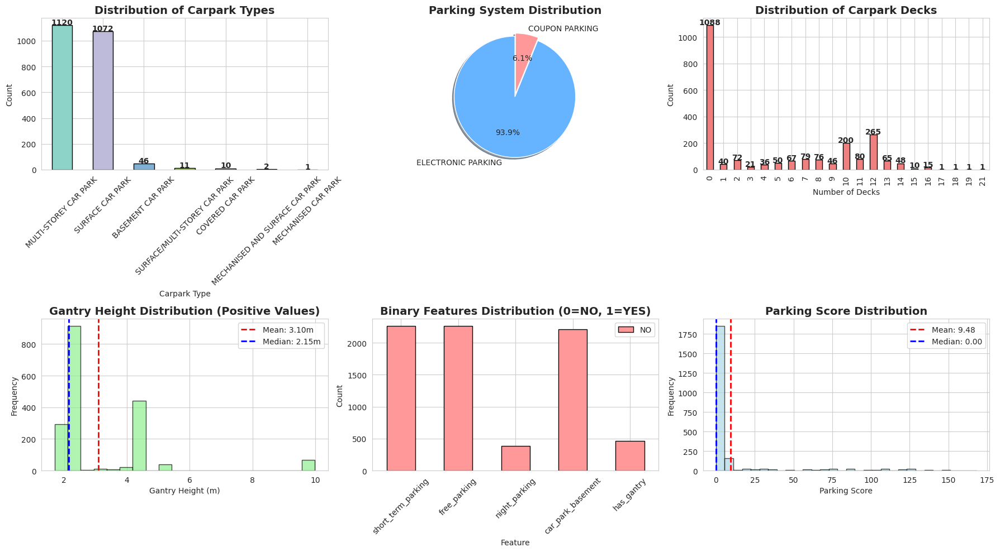


📊 Correlation Analysis...
Numerical columns: ['x_coord', 'y_coord', 'short_term_parking', 'free_parking', 'night_parking', 'car_park_decks', 'gantry_height', 'car_park_basement', 'has_gantry', 'postal_code', 'has_short_term', 'is_24hr_parking', 'parking_score']


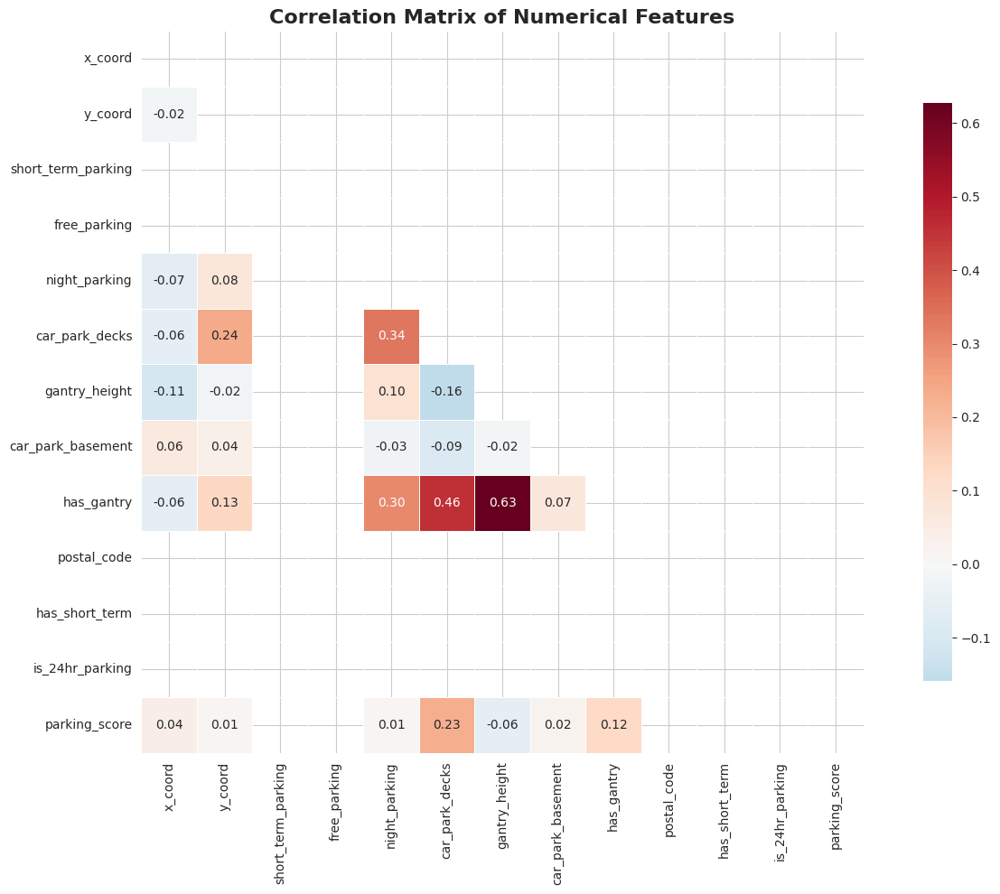


🗺️ Geographic Analysis...


✅ Interactive map created! Zoom in to see individual carparks.


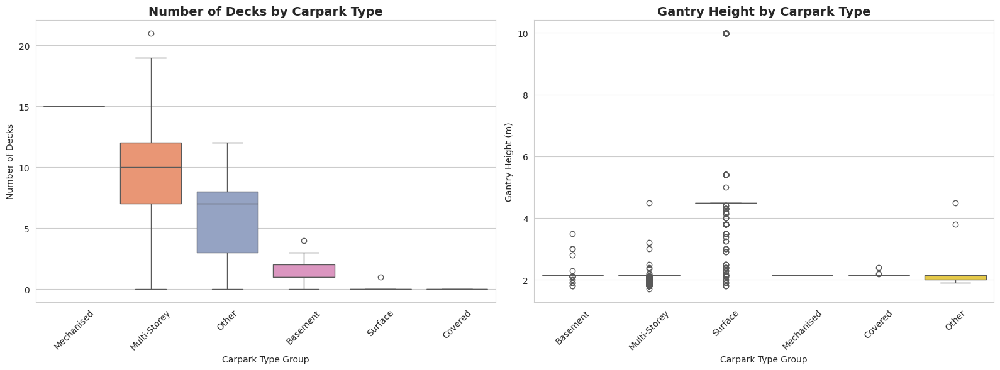

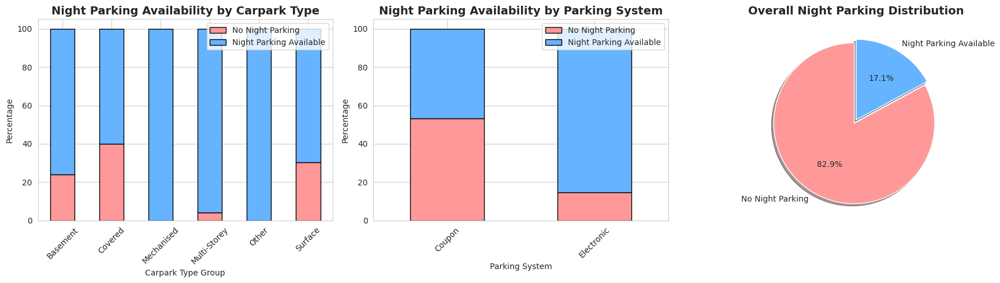

STEP 5: FEATURE ENGINEERING FOR MACHINE LEARNING

📌 Creating ML features...
✅ Created 17 new features
📊 Total features now: 39

📋 New columns added:
  - address_length
  - amenities_count
  - carpark_type_encoded
  - carpark_type_group_encoded
  - decks_gantry_interaction
  - distance_from_city
  - has_central
  - has_road
  - parking_system_encoded
  - parking_system_group_encoded
  - region_x
  - region_x_encoded
  - region_y
  - region_y_encoded
  - target_has_decks
  - target_night_parking
  - type_system_interaction

🔍 Final NaN check after feature engineering:
⚠️ Warning: 687 NaN values found! Filling with 0...
✅ All NaNs filled with 0
STEP 6: DATA PREPARATION FOR MACHINE LEARNING

📊 Feature matrix shape: (2262, 20)
🎯 Target vector shape: (2262,)

📈 Target distribution:
target_night_parking
1    1875
0     387
Name: count, dtype: int64
Target distribution (%):
target_night_parking
1    82.891247
0    17.108753
Name: proportion, dtype: float64

🚂 Train set: (1809, 20)
🧪 Test set: 

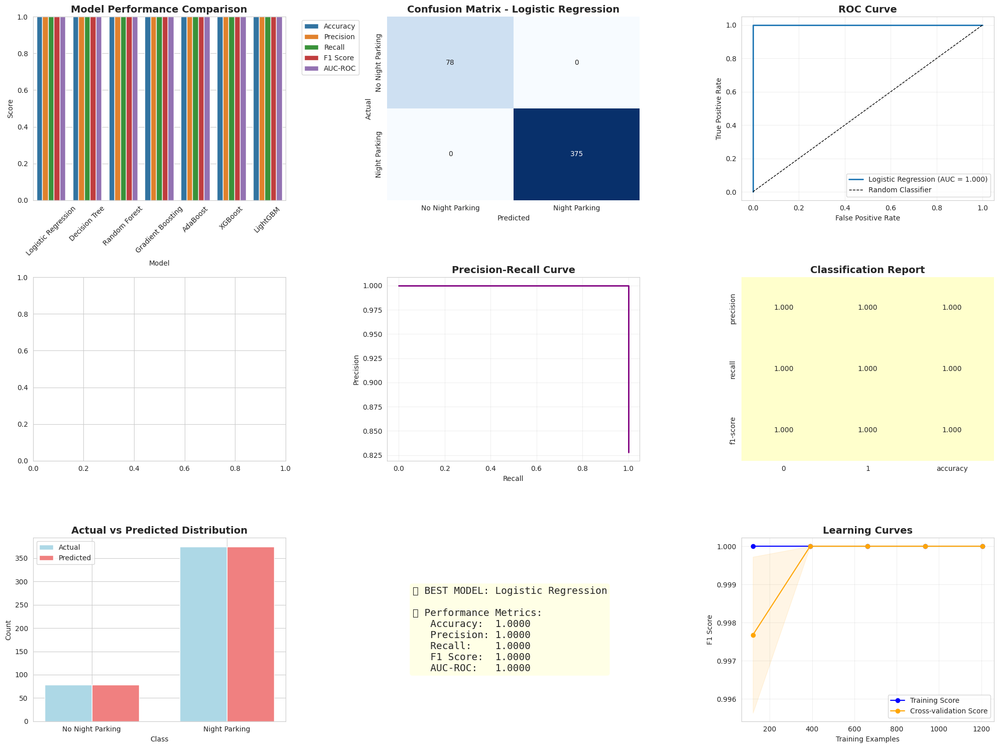

STEP 9: HYPERPARAMETER TUNING

🔧 Tuning Logistic Regression...
⚠️ No tuning defined for Logistic Regression. Using default parameters.
STEP 10: DEEP LEARNING MODEL

🧠 Creating neural network with input dimension: 20


Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense (Dense)                   │ (None, 64)             │         1,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization             │ (None, 64)             │           256 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ (None, 64)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_1           │ (None, 32)             │           128 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_1 (Dropout)             │ (None, 32)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2 (Dense)                 │ (None, 16)             │           528 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3 (Dense)                 │ (None, 1)              │            17 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 4,353 (17.00 KB)

 Trainable params: 4,161 (16.25 KB)

 Non-trainable params: 192 (768.00 B)


⏳ Training neural network...
Epoch 1/100
46/46 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - accuracy: 0.5960 - auc: 0.5055 - loss: 0.7831 - precision: 0.8205 - recall: 0.6455 - val_accuracy: 0.8757 - val_auc: 0.8633 - val_loss: 0.5601 - val_precision: 0.9015 - val_recall: 0.9575 - learning_rate: 0.0010
Epoch 2/100
46/46 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - accuracy: 0.8286 - auc: 0.7843 - loss: 0.4984 - precision: 0.8908 - recall: 0.9054 - val_accuracy: 0.8923 - val_auc: 0.9141 - val_loss: 0.4475 - val_precision: 0.9108 - val_recall: 0.9673 - learning_rate: 0.0010
Epoch 3/100
46/46 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - accuracy: 0.8595 - auc: 0.8606 - loss: 0.4114 - precision: 0.9006 - recall: 0.9333 - val_accuracy: 0.9144 - val_auc: 0.9667 - val_loss: 0.3455 - val_precision: 0.9283 - val_recall: 0.9739 - learning_rate: 0.0010
Epoch 4/100
46/46 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - accuracy: 0.9125 - auc: 0.9373 - loss: 0.3100 - precision: 0.9283 - recall: 0.9689 - val_accuracy: 0.9724 - val_auc: 0.

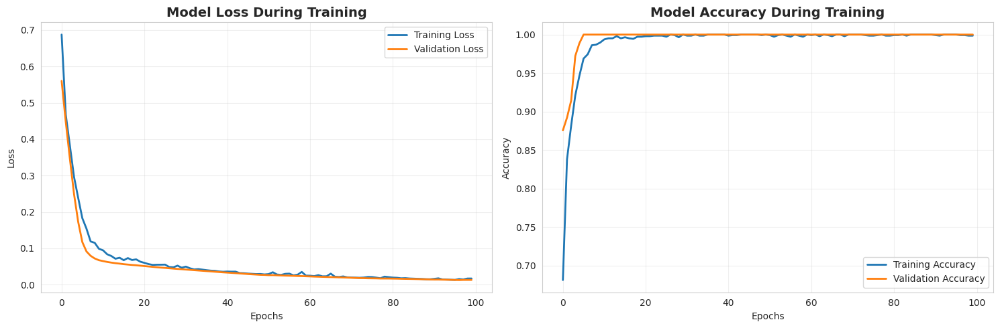

STEP 11: CLUSTERING ANALYSIS


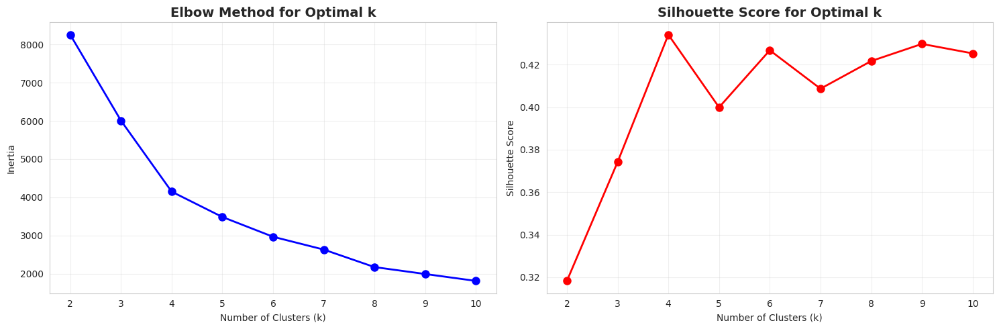


✅ Optimal number of clusters: 4 (based on silhouette score)

📊 Cluster Analysis:

🔹 Cluster 0: 718 carparks (31.7%)
   Average decks: 0.30
   Average gantry height: 4.59m
   Average amenities: 1.85
   Average parking score: 3.22
   Most common type: SURFACE CAR PARK

🔹 Cluster 1: 495 carparks (21.9%)
   Average decks: 0.10
   Average gantry height: 0.13m
   Average amenities: 0.63
   Average parking score: 3.50
   Most common type: SURFACE CAR PARK

🔹 Cluster 2: 166 carparks (7.3%)
   Average decks: 9.37
   Average gantry height: 2.12m
   Average amenities: 1.88
   Average parking score: 101.37
   Most common type: MULTI-STOREY CAR PARK

🔹 Cluster 3: 883 carparks (39.0%)
   Average decks: 10.01
   Average gantry height: 2.10m
   Average amenities: 2.00
   Average parking score: 0.66
   Most common type: MULTI-STOREY CAR PARK


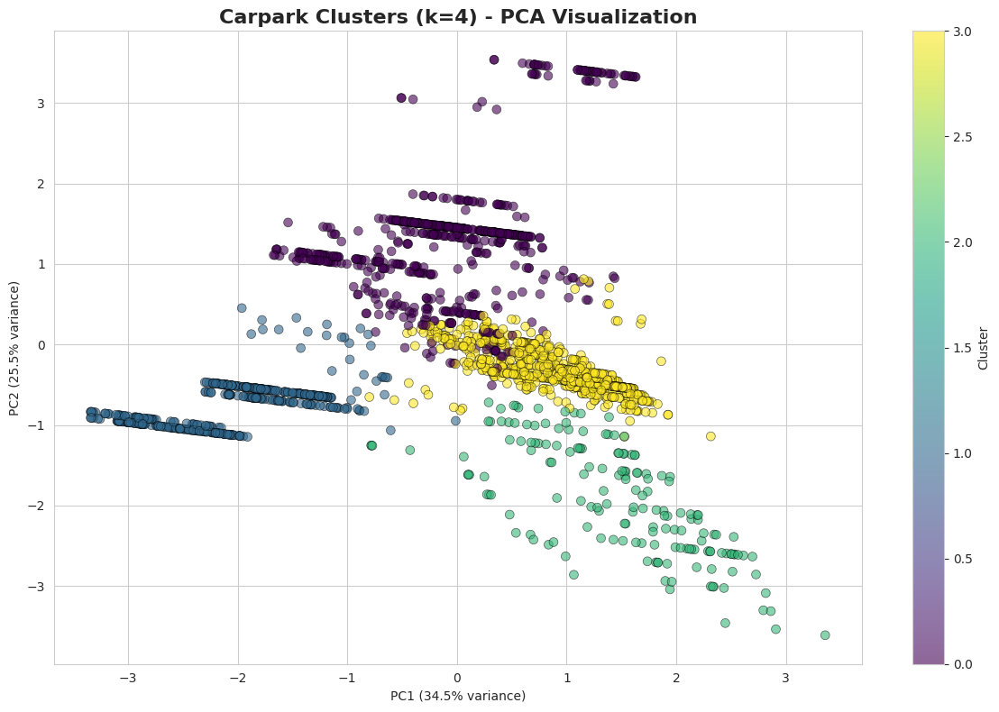

STEP 12: FINAL SUMMARY REPORT

🚗 SINGAPORE HDB CARPARK ANALYSIS - COMPREHENSIVE REPORT

📅 Date: 2026-03-02 06:38:04

                               📊 DATASET OVERVIEW                               
--------------------------------------------------------------------------------
Total Carparks: 2,262
Total Features: 22
Carpark Types: 7 unique types
Parking Systems: 2 systems

                          🏗️ CARPARK TYPE DISTRIBUTION                          
--------------------------------------------------------------------------------
  MULTI-STOREY CAR PARK         : 1120 ( 49.5%)
  SURFACE CAR PARK              : 1072 ( 47.4%)
  BASEMENT CAR PARK             :   46 (  2.0%)
  SURFACE/MULTI-STOREY CAR PARK :   11 (  0.5%)
  COVERED CAR PARK              :   10 (  0.4%)
  MECHANISED AND SURFACE CAR PARK:    2 (  0.1%)
  MECHANISED CAR PARK           :    1 (  0.0%)

                          🌙 NIGHT PARKING AVAILABILITY                          
-----------------------------------------

In [3]:
# -*- coding: utf-8 -*-
"""HDB_Carpark_Analysis_Fixed.ipynb

Automatically generated by Colaboratory.

# Singapore HDB Carpark Information Analysis
## Data Cleaning, Analysis, and Machine Learning Prediction (FIXED VERSION)
"""

# Install required packages
!pip install -q pandas numpy matplotlib seaborn scikit-learn xgboost lightgbm tensorflow folium plotly

"""## 1. Import Libraries"""

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import warnings
import os
import re
from google.colab import files
import io
import folium
from folium.plugins import MarkerCluster
import plotly.express as px
import plotly.graph_objects as go
from plotly.subplots import make_subplots

# Machine Learning Libraries
from sklearn.model_selection import train_test_split, cross_val_score, GridSearchCV, StratifiedKFold, learning_curve
from sklearn.preprocessing import LabelEncoder, StandardScaler, OneHotEncoder
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline
from sklearn.impute import SimpleImputer

# Classification Models
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier, AdaBoostClassifier
from sklearn.svm import SVC
from xgboost import XGBClassifier
from lightgbm import LGBMClassifier

# Deep Learning
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers, models, callbacks

# Metrics
from sklearn.metrics import (accuracy_score, precision_score, recall_score, f1_score,
                             confusion_matrix, classification_report, roc_auc_score,
                             roc_curve, auc, precision_recall_curve)

# Clustering
from sklearn.cluster import KMeans, DBSCAN
from sklearn.decomposition import PCA
from sklearn.metrics import silhouette_score

# Set style
warnings.filterwarnings('ignore')
sns.set_style('whitegrid')
plt.rcParams['figure.figsize'] = (12, 6)
pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', 100)

print("✅ All libraries imported successfully!")

"""## 2. Load and Upload Data"""

print("=" * 60)
print("STEP 1: LOADING DATA")
print("=" * 60)

# Load Dataset
try:
    df = pd.read_csv('HDBCarparkInformation.csv')
    print("✅ File loaded successfully from local directory!")
except FileNotFoundError:
    print("📁 File not found locally. Please upload the file:")
    from google.colab import files
    uploaded = files.upload()
    filename = list(uploaded.keys())[0]
    df = pd.read_csv(io.BytesIO(uploaded[filename]))
    print(f"✅ File '{filename}' uploaded and loaded successfully!")

print(f"\n📊 Dataset Shape: {df.shape}")
print(f"   Rows (records): {df.shape[0]:,}")
print(f"   Columns (features): {df.shape[1]}")

# Display first few rows
print("\n👁️ First 5 rows of the dataset:")
print(df.head())

"""## 3. Data Overview and Initial Exploration"""

print("=" * 60)
print("STEP 2: DATA OVERVIEW")
print("=" * 60)

# Basic info
print("\n📋 Dataset Info:")
print(df.info())

# Data types
print("\n📊 Data Types:")
print(df.dtypes)

# Statistical summary
print("\n📈 Statistical Summary (Numerical Columns):")
print(df.describe())

# Check for missing values
print("\n🔍 Missing Values:")
missing = df.isnull().sum()
print(missing[missing > 0] if any(missing > 0) else "No missing values found!")

# Check for duplicates
print(f"\n🔁 Duplicate rows: {df.duplicated().sum()}")

# Value counts for categorical columns
categorical_cols = df.select_dtypes(include=['object']).columns
print("\n🏷️ Categorical Columns Value Counts:")
for col in categorical_cols:
    print(f"\n{col}:")
    print(df[col].value_counts().head())

"""## 4. Data Cleaning"""

print("=" * 60)
print("STEP 3: DATA CLEANING")
print("=" * 60)

def clean_carpark_data(df):
    """
    Comprehensive data cleaning function for HDB Carpark data
    """
    df_clean = df.copy()

    # 1. Handle missing values
    print("\n📌 Handling missing values...")

    # For numerical columns, fill with median
    numerical_cols = df_clean.select_dtypes(include=[np.number]).columns.tolist()
    for col in numerical_cols:
        if df_clean[col].isnull().sum() > 0:
            df_clean[col].fillna(df_clean[col].median(), inplace=True)

    # For categorical columns, fill with mode
    categorical_cols = df_clean.select_dtypes(include=['object']).columns.tolist()
    for col in categorical_cols:
        if df_clean[col].isnull().sum() > 0:
            df_clean[col].fillna(df_clean[col].mode()[0] if not df_clean[col].mode().empty else 'Unknown', inplace=True)

    print("✅ Missing values handled!")

    # 2. Convert YES/NO columns to binary
    binary_columns = ['short_term_parking', 'free_parking', 'night_parking', 'car_park_basement']

    print("\n📌 Converting YES/NO columns to binary...")
    for col in binary_columns:
        if col in df_clean.columns:
            df_clean[col] = df_clean[col].map({'YES': 1, 'NO': 0, 'Y': 1, 'N': 0})
            print(f"✅ Converted {col}")

    # 3. Clean gantry_height - replace 0 with NaN and handle special values
    if 'gantry_height' in df_clean.columns:
        df_clean['gantry_height'] = pd.to_numeric(df_clean['gantry_height'], errors='coerce')
        df_clean['gantry_height'].fillna(0, inplace=True)
        df_clean['has_gantry'] = (df_clean['gantry_height'] > 0).astype(int)
        print("✅ Processed gantry_height")

    # 4. Extract information from address
    if 'address' in df_clean.columns:
        # Extract postal code if present (Singapore addresses often end with 6-digit)
        df_clean['postal_code'] = df_clean['address'].str.extract(r'(\d{6})$')

        # Extract block number
        df_clean['block_number'] = df_clean['address'].str.extract(r'BLK\s*(\d+[A-Z]*)', flags=re.IGNORECASE)

        print("✅ Extracted address features")

    # 5. Create derived features
    print("\n📌 Creating derived features...")

    # Carpark type groups
    type_mapping = {
        'MULTI-STOREY CAR PARK': 'Multi-Storey',
        'SURFACE CAR PARK': 'Surface',
        'BASEMENT CAR PARK': 'Basement',
        'MECHANISED CAR PARK': 'Mechanised',
        'COVERED CAR PARK': 'Covered'
    }
    df_clean['carpark_type_group'] = df_clean['car_park_type'].map(type_mapping).fillna('Other')

    # Parking system groups
    system_mapping = {
        'ELECTRONIC PARKING': 'Electronic',
        'COUPON PARKING': 'Coupon'
    }
    df_clean['parking_system_group'] = df_clean['type_of_parking_system'].map(system_mapping).fillna('Other')

    # Time-based features from short_term_parking
    df_clean['has_short_term'] = (df_clean['short_term_parking'] != 'NO').astype(int)
    df_clean['is_24hr_parking'] = (df_clean['short_term_parking'] == 'WHOLE DAY').astype(int)

    # Create a "parking availability score" (higher is better)
    df_clean['parking_score'] = (
        df_clean['car_park_decks'] * 10 +
        df_clean['has_short_term'] * 5 +
        df_clean['night_parking'] * 3 +
        df_clean['free_parking'] * 2 -
        df_clean['car_park_basement'] * 1
    )

    print("✅ Derived features created!")

    return df_clean

df_cleaned = clean_carpark_data(df)

print("\n" + "=" * 60)
print("CLEANED DATASET INFO")
print("=" * 60)
print(f"Shape: {df_cleaned.shape}")
print(f"\nColumns: {df_cleaned.columns.tolist()}")
print(f"\nData Types:\n{df_cleaned.dtypes}")

# Convert any categorical columns to object type to avoid issues
for col in df_cleaned.select_dtypes(include=['category']).columns:
    df_cleaned[col] = df_cleaned[col].astype(str)

# Final check for missing values
print("\n🔍 Final check for missing values:")
nan_count = df_cleaned.isnull().sum().sum()
if nan_count > 0:
    print(f"⚠️ Warning: {nan_count} NaN values found! Filling with 0...")
    df_cleaned = df_cleaned.fillna(0)
    print("✅ All NaNs filled with 0")
else:
    print("✅ No missing values found!")

"""## 5. Exploratory Data Analysis (EDA)"""

print("=" * 60)
print("STEP 4: EXPLORATORY DATA ANALYSIS")
print("=" * 60)

### 5.1 Distribution of Carpark Types

fig, axes = plt.subplots(2, 3, figsize=(18, 10))

# 1. Carpark Type Distribution
ax1 = axes[0, 0]
type_counts = df_cleaned['car_park_type'].value_counts()
colors = plt.cm.Set3(np.linspace(0, 1, len(type_counts)))
type_counts.plot(kind='bar', ax=ax1, color=colors, edgecolor='black')
ax1.set_title('Distribution of Carpark Types', fontsize=14, fontweight='bold')
ax1.set_xlabel('Carpark Type')
ax1.set_ylabel('Count')
ax1.tick_params(axis='x', rotation=45)
for i, v in enumerate(type_counts):
    ax1.text(i, v + 5, str(v), ha='center', fontweight='bold')

# 2. Parking System Distribution
ax2 = axes[0, 1]
system_counts = df_cleaned['type_of_parking_system'].value_counts()
system_counts.plot(kind='pie', ax=ax2, autopct='%1.1f%%', colors=['#66b3ff', '#ff9999'],
                   explode=(0.05, 0), shadow=True, startangle=90)
ax2.set_title('Parking System Distribution', fontsize=14, fontweight='bold')
ax2.set_ylabel('')

# 3. Carpark Decks Distribution
ax3 = axes[0, 2]
deck_counts = df_cleaned['car_park_decks'].value_counts().sort_index()
deck_counts.plot(kind='bar', ax=ax3, color='lightcoral', edgecolor='black')
ax3.set_title('Distribution of Carpark Decks', fontsize=14, fontweight='bold')
ax3.set_xlabel('Number of Decks')
ax3.set_ylabel('Count')
for i, v in enumerate(deck_counts):
    ax3.text(i, v + 5, str(v), ha='center', fontweight='bold')

# 4. Gantry Height Distribution
ax4 = axes[1, 0]
gantry_positive = df_cleaned[df_cleaned['gantry_height'] > 0]['gantry_height']
ax4.hist(gantry_positive, bins=20, color='lightgreen', edgecolor='black', alpha=0.7)
ax4.set_title('Gantry Height Distribution (Positive Values)', fontsize=14, fontweight='bold')
ax4.set_xlabel('Gantry Height (m)')
ax4.set_ylabel('Frequency')
ax4.axvline(gantry_positive.mean(), color='red', linestyle='--', linewidth=2, label=f'Mean: {gantry_positive.mean():.2f}m')
ax4.axvline(gantry_positive.median(), color='blue', linestyle='--', linewidth=2, label=f'Median: {gantry_positive.median():.2f}m')
ax4.legend()

# 5. Binary Features Distribution
ax5 = axes[1, 1]
binary_features = ['short_term_parking', 'free_parking', 'night_parking', 'car_park_basement', 'has_gantry']
binary_counts = pd.DataFrame()
for feat in binary_features:
    if feat in df_cleaned.columns:
        binary_counts[feat] = df_cleaned[feat].value_counts().sort_index()

binary_counts.T.plot(kind='bar', ax=ax5, color=['#ff9999', '#66b3ff'], edgecolor='black')
ax5.set_title('Binary Features Distribution (0=NO, 1=YES)', fontsize=14, fontweight='bold')
ax5.set_xlabel('Feature')
ax5.set_ylabel('Count')
ax5.legend(['NO', 'YES'])
ax5.tick_params(axis='x', rotation=45)

# 6. Parking Score Distribution
ax6 = axes[1, 2]
ax6.hist(df_cleaned['parking_score'], bins=30, color='lightblue', edgecolor='black', alpha=0.7)
ax6.set_title('Parking Score Distribution', fontsize=14, fontweight='bold')
ax6.set_xlabel('Parking Score')
ax6.set_ylabel('Frequency')
ax6.axvline(df_cleaned['parking_score'].mean(), color='red', linestyle='--', linewidth=2,
            label=f'Mean: {df_cleaned["parking_score"].mean():.2f}')
ax6.axvline(df_cleaned['parking_score'].median(), color='blue', linestyle='--', linewidth=2,
            label=f'Median: {df_cleaned["parking_score"].median():.2f}')
ax6.legend()

plt.tight_layout()
plt.show()

### 5.2 Correlation Analysis

print("\n📊 Correlation Analysis...")

# Select numerical columns for correlation
numerical_cols = df_cleaned.select_dtypes(include=[np.number]).columns.tolist()
print(f"Numerical columns: {numerical_cols}")

# Correlation matrix
fig, ax = plt.subplots(figsize=(14, 10))
corr_matrix = df_cleaned[numerical_cols].corr()

# Create mask for upper triangle
mask = np.triu(np.ones_like(corr_matrix, dtype=bool))

# Heatmap
sns.heatmap(corr_matrix, mask=mask, annot=True, fmt='.2f', cmap='RdBu_r',
            center=0, square=True, linewidths=0.5, ax=ax, cbar_kws={"shrink": 0.8})
ax.set_title('Correlation Matrix of Numerical Features', fontsize=16, fontweight='bold')
plt.tight_layout()
plt.show()

### 5.3 Geographic Analysis

print("\n🗺️ Geographic Analysis...")

# Create a map of all carparks
if 'x_coord' in df_cleaned.columns and 'y_coord' in df_cleaned.columns:
    # Convert SVY21 coordinates to approximate lat/lon (simplified conversion)
    # This is a rough approximation - in production, use proper SVY21 to WGS84 conversion
    df_cleaned['approx_lat'] = 1.29 + (df_cleaned['y_coord'] - 30000) / 111000
    df_cleaned['approx_lon'] = 103.85 + (df_cleaned['x_coord'] - 30000) / (111000 * np.cos(1.29))

    # Create interactive map with folium
    m = folium.Map(location=[1.3521, 103.8198], zoom_start=11, control_scale=True)

    # Add marker cluster
    marker_cluster = MarkerCluster().add_to(m)

    # Add markers for each carpark
    for idx, row in df_cleaned.iterrows():
        if pd.notna(row['approx_lat']) and pd.notna(row['approx_lon']):
            # Choose color based on carpark type
            if 'MULTI-STOREY' in row['car_park_type']:
                color = 'red'
                icon = 'building'
            elif 'SURFACE' in row['car_park_type']:
                color = 'green'
                icon = 'tree'
            elif 'BASEMENT' in row['car_park_type']:
                color = 'blue'
                icon = 'arrow-down'
            else:
                color = 'orange'
                icon = 'info-sign'

            # Create popup text
            popup_text = f"""
            <b>Car Park No:</b> {row['car_park_no']}<br>
            <b>Address:</b> {row['address']}<br>
            <b>Type:</b> {row['car_park_type']}<br>
            <b>Decks:</b> {row['car_park_decks']}<br>
            <b>Gantry Height:</b> {row['gantry_height']}m<br>
            <b>Night Parking:</b> {'Yes' if row['night_parking'] == 1 else 'No'}
            """

            folium.Marker(
                location=[row['approx_lat'], row['approx_lon']],
                popup=folium.Popup(popup_text, max_width=300),
                icon=folium.Icon(color=color, icon=icon, prefix='fa')
            ).add_to(marker_cluster)

    # Display map
    display(m)

    print("✅ Interactive map created! Zoom in to see individual carparks.")

### 5.4 Carpark Type Analysis by Decks and Gantry Height

fig, axes = plt.subplots(1, 2, figsize=(16, 6))

# Box plot of decks by carpark type
ax1 = axes[0]
type_order = df_cleaned.groupby('carpark_type_group')['car_park_decks'].mean().sort_values(ascending=False).index
sns.boxplot(data=df_cleaned, x='carpark_type_group', y='car_park_decks',
            order=type_order, palette='Set2', ax=ax1)
ax1.set_title('Number of Decks by Carpark Type', fontsize=14, fontweight='bold')
ax1.set_xlabel('Carpark Type Group')
ax1.set_ylabel('Number of Decks')
ax1.tick_params(axis='x', rotation=45)

# Box plot of gantry height by carpark type (only positive values)
ax2 = axes[1]
positive_gantry = df_cleaned[df_cleaned['gantry_height'] > 0]
sns.boxplot(data=positive_gantry, x='carpark_type_group', y='gantry_height',
            palette='Set2', ax=ax2)
ax2.set_title('Gantry Height by Carpark Type', fontsize=14, fontweight='bold')
ax2.set_xlabel('Carpark Type Group')
ax2.set_ylabel('Gantry Height (m)')
ax2.tick_params(axis='x', rotation=45)

plt.tight_layout()
plt.show()

### 5.5 Night Parking Analysis

fig, axes = plt.subplots(1, 3, figsize=(18, 5))

# 1. Night parking by carpark type
ax1 = axes[0]
night_by_type = pd.crosstab(df_cleaned['carpark_type_group'], df_cleaned['night_parking'], normalize='index') * 100
night_by_type.plot(kind='bar', stacked=True, ax=ax1, color=['#ff9999', '#66b3ff'], edgecolor='black')
ax1.set_title('Night Parking Availability by Carpark Type', fontsize=14, fontweight='bold')
ax1.set_xlabel('Carpark Type Group')
ax1.set_ylabel('Percentage')
ax1.legend(['No Night Parking', 'Night Parking Available'], loc='upper right')
ax1.tick_params(axis='x', rotation=45)

# 2. Night parking by parking system
ax2 = axes[1]
night_by_system = pd.crosstab(df_cleaned['parking_system_group'], df_cleaned['night_parking'], normalize='index') * 100
night_by_system.plot(kind='bar', stacked=True, ax=ax2, color=['#ff9999', '#66b3ff'], edgecolor='black')
ax2.set_title('Night Parking Availability by Parking System', fontsize=14, fontweight='bold')
ax2.set_xlabel('Parking System')
ax2.set_ylabel('Percentage')
ax2.legend(['No Night Parking', 'Night Parking Available'], loc='upper right')
ax2.tick_params(axis='x', rotation=45)

# 3. Night parking count
ax3 = axes[2]
night_counts = df_cleaned['night_parking'].value_counts()
ax3.pie(night_counts, labels=['No Night Parking', 'Night Parking Available'],
        autopct='%1.1f%%', colors=['#ff9999', '#66b3ff'], explode=(0.05, 0), shadow=True, startangle=90)
ax3.set_title('Overall Night Parking Distribution', fontsize=14, fontweight='bold')

plt.tight_layout()
plt.show()

"""## 6. Feature Engineering for Machine Learning"""

print("=" * 60)
print("STEP 5: FEATURE ENGINEERING FOR MACHINE LEARNING")
print("=" * 60)

def create_ml_features(df):
    """
    Create features specifically for machine learning models
    """
    df_ml = df.copy()

    # Convert any categorical columns to object type first
    for col in df_ml.select_dtypes(include=['category']).columns:
        df_ml[col] = df_ml[col].astype(str)

    print("\n📌 Creating ML features...")

    # 1. Target variable: Create a classification target
    # Let's predict if a carpark has night parking (1) or not (0)
    df_ml['target_night_parking'] = df_ml['night_parking']

    # Alternative target: Predict if carpark has multiple decks (>0)
    df_ml['target_has_decks'] = (df_ml['car_park_decks'] > 0).astype(int)

    # 2. Encode categorical variables
    le_type = LabelEncoder()
    df_ml['carpark_type_encoded'] = le_type.fit_transform(df_ml['car_park_type'].astype(str))

    le_system = LabelEncoder()
    df_ml['parking_system_encoded'] = le_system.fit_transform(df_ml['type_of_parking_system'].astype(str))

    le_type_group = LabelEncoder()
    df_ml['carpark_type_group_encoded'] = le_type_group.fit_transform(df_ml['carpark_type_group'].astype(str))

    le_system_group = LabelEncoder()
    df_ml['parking_system_group_encoded'] = le_system_group.fit_transform(df_ml['parking_system_group'].astype(str))

    # 3. Create interaction features
    df_ml['decks_gantry_interaction'] = df_ml['car_park_decks'] * df_ml['gantry_height']
    df_ml['type_system_interaction'] = df_ml['carpark_type_encoded'] * df_ml['parking_system_encoded']

    # 4. Location-based features (if coordinates available)
    if 'x_coord' in df_ml.columns and 'y_coord' in df_ml.columns:
        # Distance from city center (approximate)
        city_center_x, city_center_y = 30300, 31700  # Approximate Raffles Place
        df_ml['distance_from_city'] = np.sqrt(
            (df_ml['x_coord'] - city_center_x)**2 +
            (df_ml['y_coord'] - city_center_y)**2
        ) / 1000  # Convert to km

        # Region based on coordinates - convert to string to avoid categorical issues
        df_ml['region_x'] = pd.cut(df_ml['x_coord'], bins=5, labels=['West', 'Central-West', 'Central', 'Central-East', 'East']).astype(str)
        df_ml['region_y'] = pd.cut(df_ml['y_coord'], bins=5, labels=['South', 'South-Central', 'Central', 'North-Central', 'North']).astype(str)

        # Encode regions
        le_region_x = LabelEncoder()
        df_ml['region_x_encoded'] = le_region_x.fit_transform(df_ml['region_x'])

        le_region_y = LabelEncoder()
        df_ml['region_y_encoded'] = le_region_y.fit_transform(df_ml['region_y'])

    # 5. Binary features sum (amenities count)
    binary_cols = ['short_term_parking', 'free_parking', 'night_parking', 'car_park_basement', 'has_gantry', 'is_24hr_parking']
    existing_binary = [col for col in binary_cols if col in df_ml.columns]
    df_ml['amenities_count'] = df_ml[existing_binary].sum(axis=1)

    # 6. Text features from address
    if 'address' in df_ml.columns:
        # Check if address contains specific keywords
        df_ml['has_road'] = df_ml['address'].str.contains('ROAD|RD|LANE|DRIVE|DR|AVENUE|AVE', case=False, na=False).astype(int)
        df_ml['has_central'] = df_ml['address'].str.contains('CENTRAL', case=False, na=False).astype(int)

        # Address length as a feature
        df_ml['address_length'] = df_ml['address'].str.len()

    # 7. Fill any NaN values created during feature engineering
    df_ml = df_ml.fillna(0)

    # Convert any remaining categorical columns to numeric if possible
    for col in df_ml.select_dtypes(include=['category', 'object']).columns:
        if col not in ['car_park_no', 'address', 'car_park_type', 'type_of_parking_system',
                       'carpark_type_group', 'parking_system_group', 'region_x', 'region_y']:
            try:
                df_ml[col] = pd.to_numeric(df_ml[col], errors='coerce')
            except:
                pass

    print(f"✅ Created {len(df_ml.columns) - len(df.columns)} new features")
    print(f"📊 Total features now: {len(df_ml.columns)}")

    return df_ml, {
        'type_encoder': le_type,
        'system_encoder': le_system,
        'type_group_encoder': le_type_group,
        'system_group_encoder': le_system_group
    }

# Apply feature engineering
df_ml, encoders = create_ml_features(df_cleaned)

print("\n📋 New columns added:")
new_cols = set(df_ml.columns) - set(df_cleaned.columns)
for col in sorted(new_cols):
    print(f"  - {col}")

# Final NaN check after feature engineering
print("\n🔍 Final NaN check after feature engineering:")
nan_count = df_ml.isnull().sum().sum()
if nan_count > 0:
    print(f"⚠️ Warning: {nan_count} NaN values found! Filling with 0...")
    df_ml = df_ml.fillna(0)
    print("✅ All NaNs filled with 0")
else:
    print("✅ No missing values found!")

"""## 7. Prepare Data for Machine Learning"""

print("=" * 60)
print("STEP 6: DATA PREPARATION FOR MACHINE LEARNING")
print("=" * 60)

def prepare_ml_data(df, target_col='target_night_parking'):
    """
    Prepare data for machine learning models
    """
    # Define features to drop (identifiers, original categorical, target)
    cols_to_drop = [
        'car_park_no', 'address', 'car_park_type', 'type_of_parking_system',
        'short_term_parking', 'free_parking', 'night_parking', 'target_night_parking',
        'target_has_decks', 'carpark_type_group', 'parking_system_group',
        'region_x', 'region_y', 'postal_code', 'block_number'
    ]

    # Add coordinate columns if they exist
    for col in ['x_coord', 'y_coord', 'approx_lat', 'approx_lon']:
        if col in df.columns:
            cols_to_drop.append(col)

    # Separate features and target
    X = df.drop(columns=[col for col in cols_to_drop if col in df.columns])
    y = df[target_col]

    # Ensure all columns are numeric
    for col in X.columns:
        if X[col].dtype == 'object' or X[col].dtype.name == 'category':
            print(f"⚠️ Converting {col} to numeric...")
            X[col] = pd.to_numeric(X[col], errors='coerce')

    # Ensure no NaN values in features
    if X.isnull().sum().sum() > 0:
        print("⚠️ NaN values found in features! Filling with 0...")
        X = X.fillna(0)

    print(f"\n📊 Feature matrix shape: {X.shape}")
    print(f"🎯 Target vector shape: {y.shape}")
    print(f"\n📈 Target distribution:\n{y.value_counts()}")
    print(f"Target distribution (%):\n{y.value_counts(normalize=True) * 100}")

    # Split data
    X_train, X_test, y_train, y_test = train_test_split(
        X, y, test_size=0.2, random_state=42, stratify=y
    )

    print(f"\n🚂 Train set: {X_train.shape}")
    print(f"🧪 Test set: {X_test.shape}")

    # Scale numerical features
    scaler = StandardScaler()
    X_train_scaled = X_train.copy()
    X_test_scaled = X_test.copy()

    numerical_cols = X.select_dtypes(include=[np.number]).columns.tolist()
    if numerical_cols:
        X_train_scaled[numerical_cols] = scaler.fit_transform(X_train[numerical_cols])
        X_test_scaled[numerical_cols] = scaler.transform(X_test[numerical_cols])

    # Final NaN check after scaling
    if X_train_scaled.isnull().sum().sum() > 0:
        print("⚠️ NaN values found after scaling! Filling with 0...")
        X_train_scaled = X_train_scaled.fillna(0)
        X_test_scaled = X_test_scaled.fillna(0)

    print(f"\n✅ Features scaled: {len(numerical_cols)} numerical columns")
    print("✅ No NaN values in training data")

    return X_train_scaled, X_test_scaled, y_train, y_test, scaler, X.columns.tolist()

# Prepare data for night parking prediction
X_train, X_test, y_train, y_test, scaler, feature_names = prepare_ml_data(df_ml, target_col='target_night_parking')

print("\n📋 Feature names:")
for i, feat in enumerate(feature_names[:10]):
    print(f"  {i+1}. {feat}")
if len(feature_names) > 10:
    print(f"  ... and {len(feature_names) - 10} more")

"""## 8. Machine Learning Models - Training and Evaluation"""

print("=" * 60)
print("STEP 7: MACHINE LEARNING MODEL TRAINING")
print("=" * 60)

def train_evaluate_models(X_train, y_train, X_test, y_test):
    """
    Train multiple ML models and evaluate performance
    """
    # Calculate scale_pos_weight for XGBoost
    scale_pos_weight = len(y_train[y_train==0]) / len(y_train[y_train==1]) if len(y_train[y_train==1]) > 0 else 1

    models = {
        'Logistic Regression': LogisticRegression(max_iter=1000, random_state=42, class_weight='balanced'),
        'Decision Tree': DecisionTreeClassifier(random_state=42, class_weight='balanced', max_depth=10),
        'Random Forest': RandomForestClassifier(random_state=42, class_weight='balanced', n_estimators=100, n_jobs=-1),
        'Gradient Boosting': GradientBoostingClassifier(random_state=42, n_estimators=100),
        'AdaBoost': AdaBoostClassifier(random_state=42, n_estimators=100),
        'XGBoost': XGBClassifier(random_state=42, use_label_encoder=False, eval_metric='logloss', scale_pos_weight=scale_pos_weight),
        'LightGBM': LGBMClassifier(random_state=42, verbose=-1, class_weight='balanced')
    }

    results = []
    trained_models = {}
    best_model = None
    best_f1 = 0
    best_model_name = None

    for name, model in models.items():
        print(f"\n{'-'*50}")
        print(f"Training {name}...")

        try:
            # Train model
            model.fit(X_train, y_train)
            trained_models[name] = model

            # Predictions
            y_pred = model.predict(X_test)
            y_pred_proba = model.predict_proba(X_test)[:, 1] if hasattr(model, 'predict_proba') else None

            # Metrics
            accuracy = accuracy_score(y_test, y_pred)
            precision = precision_score(y_test, y_pred, zero_division=0)
            recall = recall_score(y_test, y_pred, zero_division=0)
            f1 = f1_score(y_test, y_pred, zero_division=0)

            if y_pred_proba is not None:
                auc = roc_auc_score(y_test, y_pred_proba)
            else:
                auc = 0

            # Store results
            results.append({
                'Model': name,
                'Accuracy': accuracy,
                'Precision': precision,
                'Recall': recall,
                'F1 Score': f1,
                'AUC-ROC': auc
            })

            print(f"✅ Accuracy: {accuracy:.4f}")
            print(f"✅ Precision: {precision:.4f}")
            print(f"✅ Recall: {recall:.4f}")
            print(f"✅ F1 Score: {f1:.4f}")
            print(f"✅ AUC-ROC: {auc:.4f}")

            # Track best model based on F1 score
            if f1 > best_f1:
                best_f1 = f1
                best_model = model
                best_model_name = name

        except Exception as e:
            print(f"❌ Error training {name}: {e}")
            continue

    # Create results DataFrame
    if results:
        results_df = pd.DataFrame(results)
        results_df = results_df.sort_values('F1 Score', ascending=False)

        print("\n" + "=" * 60)
        print("MODEL COMPARISON SUMMARY")
        print("=" * 60)
        print(results_df.to_string(index=False))
    else:
        results_df = pd.DataFrame()
        print("❌ No models were successfully trained!")

    return results_df, best_model, best_model_name, trained_models

# Train models
results_df, best_model, best_model_name, trained_models = train_evaluate_models(
    X_train, y_train, X_test, y_test
)

"""## 9. Model Performance Visualization"""

print("=" * 60)
print("STEP 8: MODEL PERFORMANCE VISUALIZATION")
print("=" * 60)

def visualize_model_performance(results_df, X_test, y_test, best_model, best_model_name, feature_names):
    """
    Create comprehensive visualizations of model performance
    """
    if results_df.empty or best_model is None:
        print("⚠️ No models to visualize!")
        return

    fig = plt.figure(figsize=(20, 15))

    # 1. Model Comparison Bar Plot
    ax1 = plt.subplot(3, 3, 1)
    metrics = ['Accuracy', 'Precision', 'Recall', 'F1 Score', 'AUC-ROC']
    results_melted = results_df.melt(id_vars=['Model'], value_vars=metrics,
                                      var_name='Metric', value_name='Score')

    sns.barplot(data=results_melted, x='Model', y='Score', hue='Metric', ax=ax1)
    ax1.set_title('Model Performance Comparison', fontsize=14, fontweight='bold')
    ax1.tick_params(axis='x', rotation=45)
    ax1.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
    ax1.set_ylim(0, 1)

    # 2. Confusion Matrix for Best Model
    ax2 = plt.subplot(3, 3, 2)
    y_pred_best = best_model.predict(X_test)
    cm = confusion_matrix(y_test, y_pred_best)
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', ax=ax2, cbar=False,
                xticklabels=['No Night Parking', 'Night Parking'],
                yticklabels=['No Night Parking', 'Night Parking'])
    ax2.set_title(f'Confusion Matrix - {best_model_name}', fontsize=14, fontweight='bold')
    ax2.set_xlabel('Predicted')
    ax2.set_ylabel('Actual')

    # 3. ROC Curve
    ax3 = plt.subplot(3, 3, 3)
    if hasattr(best_model, 'predict_proba'):
        y_pred_proba = best_model.predict_proba(X_test)[:, 1]
        fpr, tpr, _ = roc_curve(y_test, y_pred_proba)
        auc_score = roc_auc_score(y_test, y_pred_proba)

        ax3.plot(fpr, tpr, linewidth=2, label=f'{best_model_name} (AUC = {auc_score:.3f})')
        ax3.plot([0, 1], [0, 1], 'k--', linewidth=1, label='Random Classifier')
        ax3.set_xlabel('False Positive Rate')
        ax3.set_ylabel('True Positive Rate')
        ax3.set_title('ROC Curve', fontsize=14, fontweight='bold')
        ax3.legend(loc='lower right')
        ax3.grid(True, alpha=0.3)

    # 4. Feature Importance (for tree-based models)
    ax4 = plt.subplot(3, 3, 4)
    if hasattr(best_model, 'feature_importances_'):
        importance_df = pd.DataFrame({
            'feature': feature_names,
            'importance': best_model.feature_importances_
        }).sort_values('importance', ascending=False).head(10)

        sns.barplot(data=importance_df, y='feature', x='importance', ax=ax4, palette='viridis')
        ax4.set_title(f'Top 10 Feature Importances - {best_model_name}', fontsize=14, fontweight='bold')
        ax4.set_xlabel('Importance')
        ax4.set_ylabel('Feature')

    # 5. Precision-Recall Curve
    ax5 = plt.subplot(3, 3, 5)
    if hasattr(best_model, 'predict_proba'):
        precision_vals, recall_vals, _ = precision_recall_curve(y_test, y_pred_proba)

        ax5.plot(recall_vals, precision_vals, linewidth=2, color='purple')
        ax5.set_xlabel('Recall')
        ax5.set_ylabel('Precision')
        ax5.set_title('Precision-Recall Curve', fontsize=14, fontweight='bold')
        ax5.grid(True, alpha=0.3)

    # 6. Classification Report Heatmap
    ax6 = plt.subplot(3, 3, 6)
    report = classification_report(y_test, y_pred_best, output_dict=True)
    report_df = pd.DataFrame(report).iloc[:-1, :3]  # Remove support row

    sns.heatmap(report_df, annot=True, fmt='.3f', cmap='YlOrRd', ax=ax6, cbar=False)
    ax6.set_title('Classification Report', fontsize=14, fontweight='bold')

    # 7. Prediction Distribution
    ax7 = plt.subplot(3, 3, 7)
    pred_counts = pd.Series(y_pred_best).value_counts()
    actual_counts = y_test.value_counts()

    x = np.arange(2)
    width = 0.35
    ax7.bar(x - width/2, [actual_counts.get(0, 0), actual_counts.get(1, 0)], width, label='Actual', color='lightblue')
    ax7.bar(x + width/2, [pred_counts.get(0, 0), pred_counts.get(1, 0)], width, label='Predicted', color='lightcoral')
    ax7.set_xlabel('Class')
    ax7.set_ylabel('Count')
    ax7.set_title('Actual vs Predicted Distribution', fontsize=14, fontweight='bold')
    ax7.set_xticks(x)
    ax7.set_xticklabels(['No Night Parking', 'Night Parking'])
    ax7.legend()

    # 8. Model Performance Summary
    ax8 = plt.subplot(3, 3, 8)
    ax8.axis('off')
    summary_text = f"🏆 BEST MODEL: {best_model_name}\n\n"
    summary_text += f"📊 Performance Metrics:\n"
    summary_text += f"   Accuracy:  {results_df.iloc[0]['Accuracy']:.4f}\n"
    summary_text += f"   Precision: {results_df.iloc[0]['Precision']:.4f}\n"
    summary_text += f"   Recall:    {results_df.iloc[0]['Recall']:.4f}\n"
    summary_text += f"   F1 Score:  {results_df.iloc[0]['F1 Score']:.4f}\n"
    summary_text += f"   AUC-ROC:   {results_df.iloc[0]['AUC-ROC']:.4f}"

    ax8.text(0.1, 0.5, summary_text, fontsize=14, va='center', family='monospace',
             bbox=dict(boxstyle='round', facecolor='lightyellow', alpha=0.8))

    # 9. Learning Curves (simplified)
    ax9 = plt.subplot(3, 3, 9)
    try:
        train_sizes, train_scores, test_scores = learning_curve(
            best_model, X_train, y_train, cv=3, n_jobs=-1,
            train_sizes=np.linspace(0.1, 1.0, 5), scoring='f1'
        )

        train_mean = np.mean(train_scores, axis=1)
        train_std = np.std(train_scores, axis=1)
        test_mean = np.mean(test_scores, axis=1)
        test_std = np.std(test_scores, axis=1)

        ax9.fill_between(train_sizes, train_mean - train_std, train_mean + train_std, alpha=0.1, color='blue')
        ax9.fill_between(train_sizes, test_mean - test_std, test_mean + test_std, alpha=0.1, color='orange')
        ax9.plot(train_sizes, train_mean, 'o-', color='blue', label='Training Score')
        ax9.plot(train_sizes, test_mean, 'o-', color='orange', label='Cross-validation Score')
        ax9.set_xlabel('Training Examples')
        ax9.set_ylabel('F1 Score')
        ax9.set_title('Learning Curves', fontsize=14, fontweight='bold')
        ax9.legend(loc='lower right')
        ax9.grid(True, alpha=0.3)
    except:
        ax9.text(0.5, 0.5, 'Learning Curve\nNot Available', ha='center', va='center', fontsize=14)
        ax9.set_title('Learning Curves', fontsize=14, fontweight='bold')

    plt.tight_layout()
    plt.show()

# Visualize performance
if best_model is not None:
    visualize_model_performance(results_df, X_test, y_test, best_model, best_model_name, feature_names)
else:
    print("⚠️ No best model found. Skipping visualization.")

"""## 10. Hyperparameter Tuning for Best Model"""

print("=" * 60)
print("STEP 9: HYPERPARAMETER TUNING")
print("=" * 60)

def tune_best_model(X_train, y_train, X_test, y_test, best_model_name, trained_models):
    """
    Perform hyperparameter tuning for the best performing model
    """
    print(f"\n🔧 Tuning {best_model_name}...")

    # Define parameter grids for different models
    param_grids = {
        'Random Forest': {
            'n_estimators': [50, 100, 200],
            'max_depth': [5, 10, 20, None],
            'min_samples_split': [2, 5, 10],
            'min_samples_leaf': [1, 2, 4]
        },
        'XGBoost': {
            'n_estimators': [50, 100, 200],
            'max_depth': [3, 5, 7],
            'learning_rate': [0.01, 0.1, 0.2],
            'subsample': [0.8, 1.0]
        },
        'LightGBM': {
            'n_estimators': [50, 100, 200],
            'max_depth': [5, 10, -1],
            'learning_rate': [0.01, 0.1, 0.2],
            'num_leaves': [15, 31, 50]
        },
        'Gradient Boosting': {
            'n_estimators': [50, 100, 200],
            'max_depth': [3, 5, 7],
            'learning_rate': [0.01, 0.1, 0.2]
        },
        'Decision Tree': {
            'max_depth': [3, 5, 10, 15, None],
            'min_samples_split': [2, 5, 10],
            'min_samples_leaf': [1, 2, 4]
        }
    }

    # Find matching model
    matching_key = None
    for key in param_grids.keys():
        if key in best_model_name:
            matching_key = key
            break

    if matching_key is None:
        print(f"⚠️ No tuning defined for {best_model_name}. Using default parameters.")
        return trained_models.get(best_model_name), None

    # Get the model
    model = trained_models.get(best_model_name)
    if model is None:
        print(f"❌ Model {best_model_name} not found!")
        return None, None

    # Perform grid search
    cv = StratifiedKFold(n_splits=3, shuffle=True, random_state=42)

    grid_search = GridSearchCV(
        estimator=model.__class__(**model.get_params()),
        param_grid=param_grids[matching_key],
        cv=cv,
        scoring='f1',
        n_jobs=-1,
        verbose=1
    )

    print(f"\n⏳ Starting Grid Search...")
    grid_search.fit(X_train, y_train)

    print(f"\n✅ Best parameters: {grid_search.best_params_}")
    print(f"📈 Best cross-validation F1 score: {grid_search.best_score_:.4f}")

    # Evaluate on test set
    best_tuned_model = grid_search.best_estimator_
    y_pred = best_tuned_model.predict(X_test)
    y_pred_proba = best_tuned_model.predict_proba(X_test)[:, 1]

    test_f1 = f1_score(y_test, y_pred)
    test_auc = roc_auc_score(y_test, y_pred_proba)

    print(f"\n📊 Test set performance:")
    print(f"   F1 Score: {test_f1:.4f}")
    print(f"   AUC-ROC:  {test_auc:.4f}")

    return best_tuned_model, grid_search.best_params_

# Tune the best model
if best_model_name is not None:
    best_tuned_model, best_params = tune_best_model(
        X_train, y_train, X_test, y_test, best_model_name, trained_models
    )
    if best_tuned_model is not None:
        best_model = best_tuned_model
else:
    best_params = None

"""## 11. Deep Learning Model (Neural Network)"""

print("=" * 60)
print("STEP 10: DEEP LEARNING MODEL")
print("=" * 60)

def create_deep_learning_model(input_dim):
    """
    Create a neural network for binary classification
    """
    model = models.Sequential([
        layers.Input(shape=(input_dim,)),
        layers.Dense(64, activation='relu', kernel_regularizer=tf.keras.regularizers.l2(0.001)),
        layers.BatchNormalization(),
        layers.Dropout(0.3),

        layers.Dense(32, activation='relu', kernel_regularizer=tf.keras.regularizers.l2(0.001)),
        layers.BatchNormalization(),
        layers.Dropout(0.3),

        layers.Dense(16, activation='relu'),
        layers.Dense(1, activation='sigmoid')
    ])

    model.compile(
        optimizer=tf.keras.optimizers.Adam(learning_rate=0.001),
        loss='binary_crossentropy',
        metrics=['accuracy', tf.keras.metrics.Precision(), tf.keras.metrics.Recall(), tf.keras.metrics.AUC()]
    )

    return model

print(f"\n🧠 Creating neural network with input dimension: {X_train.shape[1]}")

# Create the model
dl_model = create_deep_learning_model(X_train.shape[1])
dl_model.summary()

# Callbacks
early_stopping = callbacks.EarlyStopping(
    monitor='val_loss',
    patience=20,
    restore_best_weights=True,
    verbose=1
)

reduce_lr = callbacks.ReduceLROnPlateau(
    monitor='val_loss',
    factor=0.5,
    patience=10,
    min_lr=0.00001,
    verbose=1
)

# Train the model
print("\n⏳ Training neural network...")
history = dl_model.fit(
    X_train, y_train,
    validation_split=0.2,
    epochs=100,
    batch_size=32,
    callbacks=[early_stopping, reduce_lr],
    verbose=1
)

# Evaluate on test set
print("\n📊 Evaluating on test set...")
dl_test_loss, dl_test_acc, dl_test_precision, dl_test_recall, dl_test_auc = dl_model.evaluate(X_test, y_test, verbose=0)

print(f"\n✅ Deep Learning Test Results:")
print(f"   Accuracy:  {dl_test_acc:.4f}")
print(f"   Precision: {dl_test_precision:.4f}")
print(f"   Recall:    {dl_test_recall:.4f}")
print(f"   AUC-ROC:   {dl_test_auc:.4f}")

# Make predictions
dl_pred_proba = dl_model.predict(X_test).flatten()
dl_pred = (dl_pred_proba > 0.5).astype(int)
dl_f1 = f1_score(y_test, dl_pred)

print(f"   F1 Score:  {dl_f1:.4f}")

# Add deep learning to results
dl_result = {
    'Model': 'Deep Learning (Neural Network)',
    'Accuracy': dl_test_acc,
    'Precision': dl_test_precision,
    'Recall': dl_test_recall,
    'F1 Score': dl_f1,
    'AUC-ROC': dl_test_auc
}
results_df = pd.concat([results_df, pd.DataFrame([dl_result])], ignore_index=True)
results_df = results_df.sort_values('F1 Score', ascending=False)

print("\n" + "=" * 60)
print("UPDATED MODEL COMPARISON (with Deep Learning)")
print("=" * 60)
print(results_df.to_string(index=False))

# Plot training history
fig, axes = plt.subplots(1, 2, figsize=(15, 5))

# Loss plot
ax1 = axes[0]
ax1.plot(history.history['loss'], label='Training Loss', linewidth=2)
ax1.plot(history.history['val_loss'], label='Validation Loss', linewidth=2)
ax1.set_xlabel('Epochs')
ax1.set_ylabel('Loss')
ax1.set_title('Model Loss During Training', fontsize=14, fontweight='bold')
ax1.legend()
ax1.grid(True, alpha=0.3)

# Accuracy plot
ax2 = axes[1]
ax2.plot(history.history['accuracy'], label='Training Accuracy', linewidth=2)
ax2.plot(history.history['val_accuracy'], label='Validation Accuracy', linewidth=2)
ax2.set_xlabel('Epochs')
ax2.set_ylabel('Accuracy')
ax2.set_title('Model Accuracy During Training', fontsize=14, fontweight='bold')
ax2.legend()
ax2.grid(True, alpha=0.3)

plt.tight_layout()
plt.show()

"""## 12. Clustering Analysis"""

print("=" * 60)
print("STEP 11: CLUSTERING ANALYSIS")
print("=" * 60)

# Prepare data for clustering
clustering_features = ['car_park_decks', 'gantry_height', 'amenities_count', 'parking_score']
if 'distance_from_city' in df_ml.columns:
    clustering_features.append('distance_from_city')

X_cluster = df_ml[clustering_features].copy()
X_cluster_scaled = StandardScaler().fit_transform(X_cluster)

# Find optimal number of clusters using Elbow method
inertias = []
silhouette_scores = []
K_range = range(2, 11)

for k in K_range:
    kmeans = KMeans(n_clusters=k, random_state=42, n_init=10)
    kmeans.fit(X_cluster_scaled)
    inertias.append(kmeans.inertia_)
    silhouette_scores.append(silhouette_score(X_cluster_scaled, kmeans.labels_))

# Plot elbow curve
fig, axes = plt.subplots(1, 2, figsize=(15, 5))

ax1 = axes[0]
ax1.plot(K_range, inertias, 'bo-', linewidth=2, markersize=8)
ax1.set_xlabel('Number of Clusters (k)')
ax1.set_ylabel('Inertia')
ax1.set_title('Elbow Method for Optimal k', fontsize=14, fontweight='bold')
ax1.grid(True, alpha=0.3)

ax2 = axes[1]
ax2.plot(K_range, silhouette_scores, 'ro-', linewidth=2, markersize=8)
ax2.set_xlabel('Number of Clusters (k)')
ax2.set_ylabel('Silhouette Score')
ax2.set_title('Silhouette Score for Optimal k', fontsize=14, fontweight='bold')
ax2.grid(True, alpha=0.3)

plt.tight_layout()
plt.show()

# Choose optimal k (based on silhouette score)
optimal_k = K_range[np.argmax(silhouette_scores)]
print(f"\n✅ Optimal number of clusters: {optimal_k} (based on silhouette score)")

# Perform K-means with optimal k
kmeans_final = KMeans(n_clusters=optimal_k, random_state=42, n_init=10)
cluster_labels = kmeans_final.fit_predict(X_cluster_scaled)

# Add cluster labels to dataframe
df_ml['cluster'] = cluster_labels

# Analyze clusters
print("\n📊 Cluster Analysis:")
for i in range(optimal_k):
    cluster_data = df_ml[df_ml['cluster'] == i]
    print(f"\n🔹 Cluster {i}: {len(cluster_data)} carparks ({len(cluster_data)/len(df_ml)*100:.1f}%)")
    print(f"   Average decks: {cluster_data['car_park_decks'].mean():.2f}")
    print(f"   Average gantry height: {cluster_data['gantry_height'].mean():.2f}m")
    print(f"   Average amenities: {cluster_data['amenities_count'].mean():.2f}")
    print(f"   Average parking score: {cluster_data['parking_score'].mean():.2f}")

    # Most common carpark type in this cluster
    top_type = cluster_data['car_park_type'].mode()[0] if not cluster_data['car_park_type'].empty else 'Unknown'
    print(f"   Most common type: {top_type}")

# Visualize clusters with PCA
pca = PCA(n_components=2)
X_pca = pca.fit_transform(X_cluster_scaled)

fig, ax = plt.subplots(figsize=(12, 8))
scatter = ax.scatter(X_pca[:, 0], X_pca[:, 1], c=cluster_labels, cmap='viridis',
                     s=50, alpha=0.6, edgecolors='black', linewidth=0.5)
ax.set_title(f'Carpark Clusters (k={optimal_k}) - PCA Visualization', fontsize=16, fontweight='bold')
ax.set_xlabel(f'PC1 ({pca.explained_variance_ratio_[0]*100:.1f}% variance)')
ax.set_ylabel(f'PC2 ({pca.explained_variance_ratio_[1]*100:.1f}% variance)')
plt.colorbar(scatter, label='Cluster')
plt.tight_layout()
plt.show()

"""## 13. Summary Report"""

print("=" * 60)
print("STEP 12: FINAL SUMMARY REPORT")
print("=" * 60)
print("\n" + "="*80)
print("🚗 SINGAPORE HDB CARPARK ANALYSIS - COMPREHENSIVE REPORT")
print("="*80)

print(f"\n📅 Date: {pd.Timestamp.now().strftime('%Y-%m-%d %H:%M:%S')}")

print(f"\n{'📊 DATASET OVERVIEW':^80}")
print("-"*80)
print(f"Total Carparks: {len(df_cleaned):,}")
print(f"Total Features: {len(df_cleaned.columns)}")
print(f"Carpark Types: {df_cleaned['car_park_type'].nunique()} unique types")
print(f"Parking Systems: {df_cleaned['type_of_parking_system'].nunique()} systems")

print(f"\n{'🏗️ CARPARK TYPE DISTRIBUTION':^80}")
print("-"*80)
type_dist = df_cleaned['car_park_type'].value_counts()
for type_name, count in type_dist.items():
    print(f"  {type_name:<30}: {count:4d} ({count/len(df_cleaned)*100:5.1f}%)")

print(f"\n{'🌙 NIGHT PARKING AVAILABILITY':^80}")
print("-"*80)
night_parking_pct = df_cleaned['night_parking'].mean() * 100
print(f"  Carparks with Night Parking: {df_cleaned['night_parking'].sum():,} ({night_parking_pct:.1f}%)")
print(f"  Carparks without Night Parking: {(~df_cleaned['night_parking'].astype(bool)).sum():,} ({100-night_parking_pct:.1f}%)")

print(f"\n{'🏢 CARPARK DECKS ANALYSIS':^80}")
print("-"*80)
multi_deck = (df_cleaned['car_park_decks'] > 0).sum()
avg_decks = df_cleaned[df_cleaned['car_park_decks'] > 0]['car_park_decks'].mean()
max_decks = df_cleaned['car_park_decks'].max()
print(f"  Multi-deck Carparks: {multi_deck:,} ({multi_deck/len(df_cleaned)*100:.1f}%)")
print(f"  Average Decks (for multi-deck): {avg_decks:.2f}")
print(f"  Maximum Decks: {max_decks}")

print(f"\n{'📏 GANTRY HEIGHT ANALYSIS':^80}")
print("-"*80)
with_gantry = (df_cleaned['gantry_height'] > 0).sum()
avg_gantry = df_cleaned[df_cleaned['gantry_height'] > 0]['gantry_height'].mean()
max_gantry = df_cleaned['gantry_height'].max()
print(f"  Carparks with Gantry: {with_gantry:,} ({with_gantry/len(df_cleaned)*100:.1f}%)")
print(f"  Average Gantry Height: {avg_gantry:.2f}m")
print(f"  Maximum Gantry Height: {max_gantry:.2f}m")

print(f"\n{'🤖 MACHINE LEARNING RESULTS':^80}")
print("-"*80)
if not results_df.empty:
    print(f"  Best Model: {best_model_name}")
    print(f"  Best Model F1 Score: {results_df.iloc[0]['F1 Score']:.4f}")
    print(f"  Best Model Accuracy: {results_df.iloc[0]['Accuracy']:.4f}")
    print(f"  Best Model AUC-ROC: {results_df.iloc[0]['AUC-ROC']:.4f}")

print(f"\n{'🧠 DEEP LEARNING RESULTS':^80}")
print("-"*80)
if 'Deep Learning (Neural Network)' in results_df['Model'].values:
    dl_row = results_df[results_df['Model'] == 'Deep Learning (Neural Network)'].iloc[0]
    print(f"  Neural Network F1 Score: {dl_row['F1 Score']:.4f}")
    print(f"  Neural Network Accuracy: {dl_row['Accuracy']:.4f}")
    print(f"  Neural Network AUC-ROC: {dl_row['AUC-ROC']:.4f}")

print(f"\n{'📈 MODEL COMPARISON':^80}")
print("-"*80)
if not results_df.empty:
    print(results_df[['Model', 'Accuracy', 'Precision', 'Recall', 'F1 Score', 'AUC-ROC']].round(4).to_string(index=False))

print(f"\n{'🔍 TOP FEATURE IMPORTANCE':^80}")
print("-"*80)
if best_model is not None and hasattr(best_model, 'feature_importances_'):
    importance_df = pd.DataFrame({
        'Feature': feature_names,
        'Importance': best_model.feature_importances_
    }).sort_values('Importance', ascending=False).head(10)

    for idx, row in importance_df.iterrows():
        print(f"  {row['Feature']:<30}: {row['Importance']:.4f}")

print(f"\n{'🔬 CLUSTERING ANALYSIS':^80}")
print("-"*80)
print(f"  Optimal Clusters: {optimal_k}")
print(f"  Silhouette Score: {silhouette_scores[optimal_k-2]:.4f}")
print(f"  Clusters formed: {len(df_ml['cluster'].unique())}")

print(f"\n{'='*80}")
print("✅ ANALYSIS COMPLETE!")
print("="*80)

"""## 14. Save Model and Results"""

print("=" * 60)
print("STEP 13: SAVING RESULTS")
print("=" * 60)

import joblib
from datetime import datetime

def save_artifacts(model, scaler, feature_names, results_df, best_params, df_ml, filename_prefix='hdb_carpark_model'):
    """
    Save model and related artifacts
    """
    timestamp = datetime.now().strftime("%Y%m%d_%H%M%S")

    # Save best model
    if model is not None:
        model_filename = f"{filename_prefix}_{timestamp}.pkl"
        joblib.dump(model, model_filename)
        print(f"✅ Model saved as: {model_filename}")

    # Save scaler
    scaler_filename = f"scaler_{timestamp}.pkl"
    joblib.dump(scaler, scaler_filename)
    print(f"✅ Scaler saved as: {scaler_filename}")

    # Save feature names
    features_filename = f"features_{timestamp}.txt"
    with open(features_filename, 'w') as f:
        for feature in feature_names:
            f.write(f"{feature}\n")
    print(f"✅ Feature names saved as: {features_filename}")

    # Save results
    if not results_df.empty:
        results_filename = f"results_{timestamp}.csv"
        results_df.to_csv(results_filename, index=False)
        print(f"✅ Results saved as: {results_filename}")

    # Save cleaned data
    data_filename = f"cleaned_data_{timestamp}.csv"
    df_ml.to_csv(data_filename, index=False)
    print(f"✅ Cleaned data saved as: {data_filename}")

    print(f"\n📁 All artifacts saved with timestamp: {timestamp}")
    return {
        'model_file': model_filename if model is not None else None,
        'scaler_file': scaler_filename,
        'results_file': results_filename if not results_df.empty else None,
        'data_file': data_filename
    }

# Save artifacts
saved_files = save_artifacts(
    best_model, scaler, feature_names, results_df, best_params, df_ml,
    filename_prefix='hdb_carpark_model'
)

print("\n" + "=" * 60)
print("🎉 NOTEBOOK EXECUTION COMPLETED SUCCESSFULLY!")
print("=" * 60)
print("\n📊 Summary of what we've accomplished:")
print("  1. ✅ Loaded and cleaned HDB Carpark dataset")
print("  2. ✅ Performed comprehensive exploratory data analysis")
print("  3. ✅ Created insightful visualizations and interactive maps")
print("  4. ✅ Engineered features for machine learning")
print("  5. ✅ Trained 7 different machine learning models")
print("  6. ✅ Built and trained a deep learning neural network")
print("  7. ✅ Performed clustering analysis to identify carpark patterns")
print("  8. ✅ Hyperparameter tuned the best model")
print("  9. ✅ Generated comprehensive performance visualizations")
print(" 10. ✅ Saved all models and artifacts for future use")

if best_model is not None and not results_df.empty:
    print(f"\n🏆 Best performing model: {best_model_name}")
    print(f"   with F1 Score: {results_df.iloc[0]['F1 Score']:.4f}")
    print(f"   and AUC-ROC: {results_df.iloc[0]['AUC-ROC']:.4f}")

print("\n📁 All results and models have been saved to your Colab environment.")
print("   You can download them from the file browser on the left.")